In [1]:
import numpy as np
import netCDF4 as nc
import matplotlib.pyplot as plt
import seaborn as sns
import os
import datetime
from sklearn import metrics
sns.set_theme()

In [204]:
a=np.linspace(.00001,.0005,50,dtype='f')
a

array([1.0e-05, 2.0e-05, 3.0e-05, 4.0e-05, 5.0e-05, 6.0e-05, 7.0e-05,
       8.0e-05, 9.0e-05, 1.0e-04, 1.1e-04, 1.2e-04, 1.3e-04, 1.4e-04,
       1.5e-04, 1.6e-04, 1.7e-04, 1.8e-04, 1.9e-04, 2.0e-04, 2.1e-04,
       2.2e-04, 2.3e-04, 2.4e-04, 2.5e-04, 2.6e-04, 2.7e-04, 2.8e-04,
       2.9e-04, 3.0e-04, 3.1e-04, 3.2e-04, 3.3e-04, 3.4e-04, 3.5e-04,
       3.6e-04, 3.7e-04, 3.8e-04, 3.9e-04, 4.0e-04, 4.1e-04, 4.2e-04,
       4.3e-04, 4.4e-04, 4.5e-04, 4.6e-04, 4.7e-04, 4.8e-04, 4.9e-04,
       5.0e-04], dtype=float32)

In [2]:
def read_forcings(path,nz_=37):
    fp = open(path,'r')
    lines=fp.readlines()
    # determine number of timesteps first 
    t = 0
    for line in lines:
        if line[0]=='!':
            continue
        lsp = line.split(' ')
        if (lsp[1]==str(nz_) or (lsp[1]==(str(nz_)+'\n'))):
            t = t+1
    data={}
    headbool=True
    ti = -1
    alt = 0
    for line in lines:
        if line[0]=='!':
            continue
        if headbool:
            headbool = False
            lsp = line.split(' ')
            head_0 = [x for x in lsp if x != '']
            n = len(head_0)
            head=[]
            for x in head_0:
                if '\n' in x:
                    x = x[0:-1]
                head.append(x)
                data[x]=np.zeros((t,nz_))
            data['time']=[]
            continue
        lsp = line.split(' ')
        if (lsp[1]==str(nz_) or (lsp[1]==(str(nz_)+'\n'))):
            data['time'].append(float(lsp[0]))
            ti=ti+1
            alt=0
            continue
        for i in range(n):
            x = head[i]
            data[x][ti,alt]=float(lsp[i])
        alt=alt+1
    data['time']=np.array(data['time'])
    return data

In [6]:
clubb_dir = '/home/tsw35/tyche/clubb/'
les_dir= '/stor/soteria/hydro/shared/data/tylersclutter/doz_tylertrim/'

In [ ]:
#############################
#### DAYLIST + TIME PREP ####
#############################

daylist=os.listdir(clubb_dir+'sgp_1c_m')
daylist.sort()

fp=nc.Dataset(les_dir+'trimdoz_20170705_01.nc','r')
dt1 = datetime.datetime(2016,1,1,0,0)
times_js = []
for t in range(len(fp['time'][:])):
    times_js.append(dt1+datetime.timedelta(minutes=int(fp['time'][t]))-datetime.timedelta(hours=5))
    
dt1 = times_js[0]
dt1 = dt1-datetime.timedelta(hours=dt1.hour)+datetime.timedelta(hours=7)
fp=nc.Dataset(clubb_dir+'sgp_1c/sgp_20180618/k_1/c_1/output/arm_sfc.nc','r')
times_clb1 = []
for t in range(len(fp['time'][:])):
    times_clb1.append(dt1+datetime.timedelta(seconds=int(t*60)))

In [79]:
a=[1,2,3,4]
a.extend([])
a

[1, 2, 3, 4]

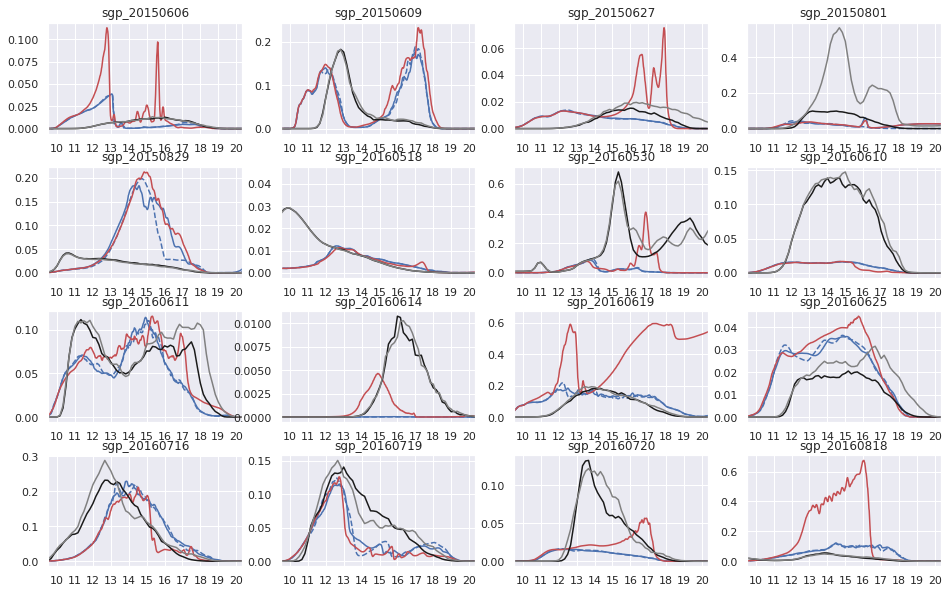

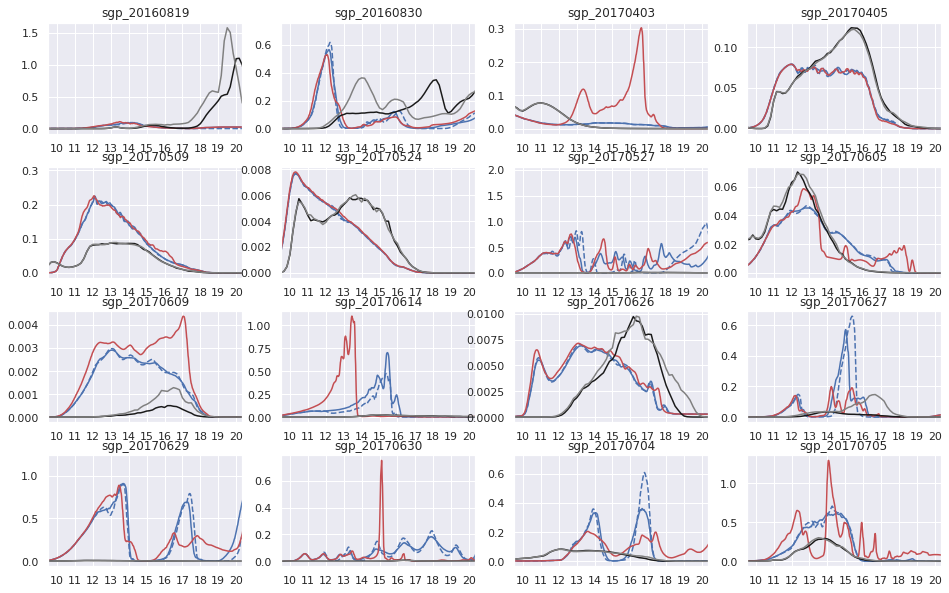

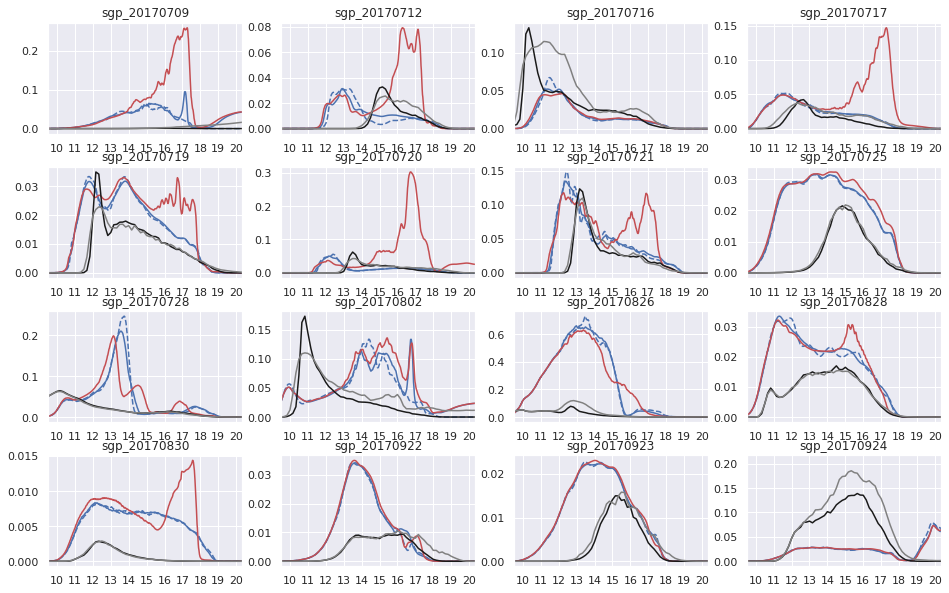

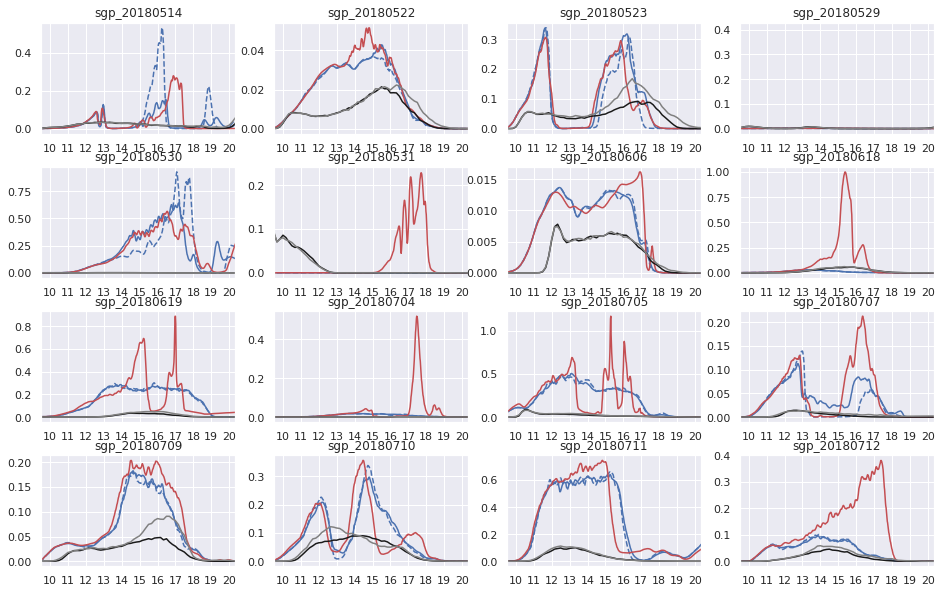

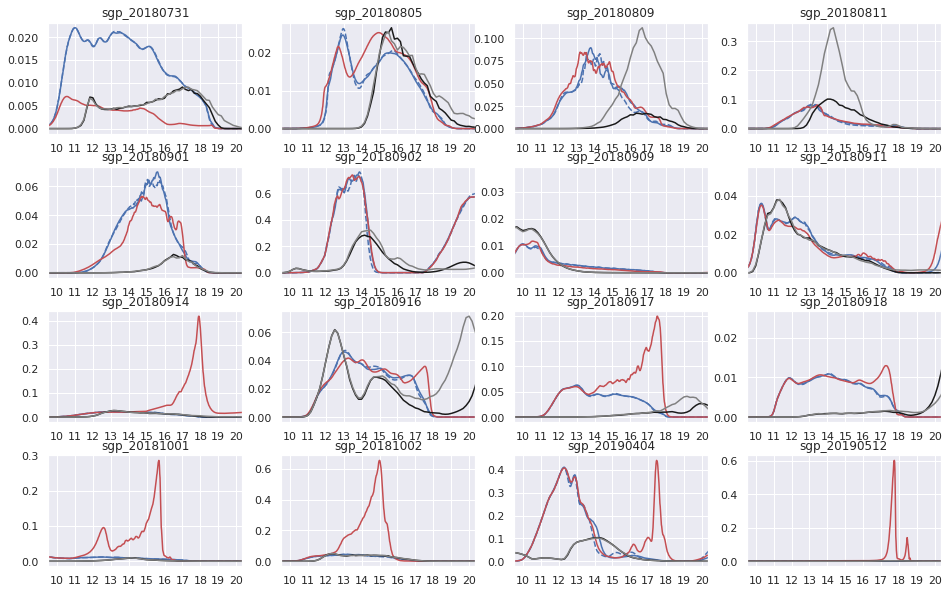

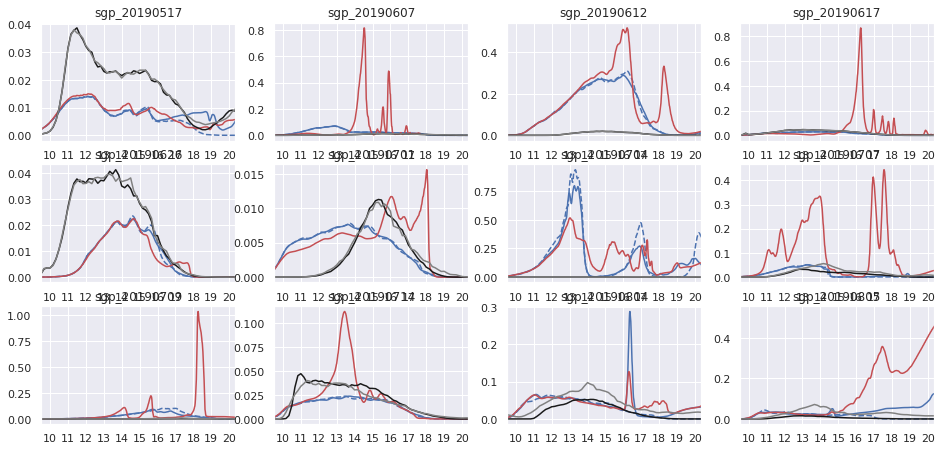

In [304]:
###########################
#### CHECK NEW SCM RUN ####
###########################

plt.figure(figsize=(16,10))
i=1

for day in daylist:
    if i==17:
        plt.subplots_adjust(hspace=.3)
        i=1
        plt.figure(figsize=(16,10))
    plt.subplot(4,4,i)
    i = i+1
    
    fp1c=nc.Dataset(clubb_dir+'sgp_1c/'+day+'/k_1/c_1/output/arm_sfc.nc','r')
    fp2c=nc.Dataset(clubb_dir+'sgp_nocpl_m/'+day+'/k_2/agg_outsfc.nc','r')
    fpcpl=nc.Dataset(clubb_dir+'sgp_cpl_m/'+day+'/k_2/agg_outsfc.nc','r')
    
    lwp_1c  = fp1c['lwp'][:,0,0,0]
    lwp_2c  = fp2c['lwp'][:,0,0,0]
    lwp_cpl = fpcpl['lwp'][:,0,0,0]
    
    time_1c  = np.array(times_clb1[0:len(lwp_1c)])
    time_2c  = np.array(times_clb1[0:len(lwp_2c)])
    time_cpl = np.array(times_clb1[0:len(lwp_cpl)])
    
    plt.plot(time_1c,lwp_1c,'b--')
    plt.plot(time_2c,lwp_2c,'b-')
    plt.plot(time_cpl,lwp_cpl,'r-')
    
    #homoLES
    fp=nc.Dataset(les_dir+'trimdoz_'+str(day[4:12])+'_01.nc','r')
    plt.plot(times_js,fp['lwp'][:],'k-')
    fp.close()
    
    #hetLES
    fp=nc.Dataset(les_dir+'trimdoz_'+str(day[4:12])+'_00.nc','r')
    plt.plot(times_js,fp['lwp'][:],'-',color='grey')
    fp.close()
    
    plt.xlim(times_js[15],times_js[80])
    
    frame1 = plt.gca()
    frame1.axes.xaxis.set_ticks([times_js[18],times_js[24],times_js[30],times_js[36],times_js[42],times_js[48],times_js[54],times_js[60],times_js[66],times_js[72],times_js[78]])
    frame1.axes.xaxis.set_ticklabels([10,11,12,13,14,15,16,17,18,19,20])
    plt.title(day)

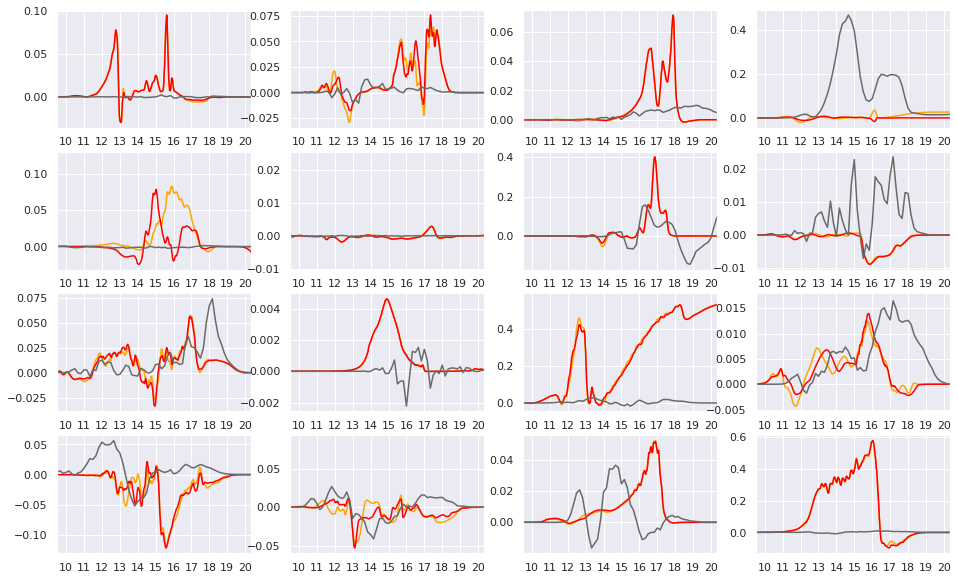

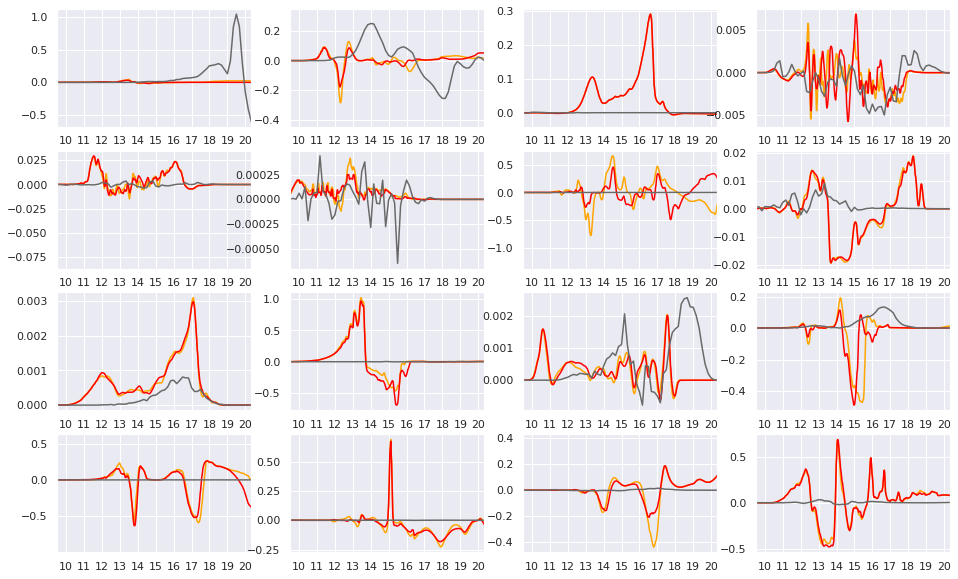

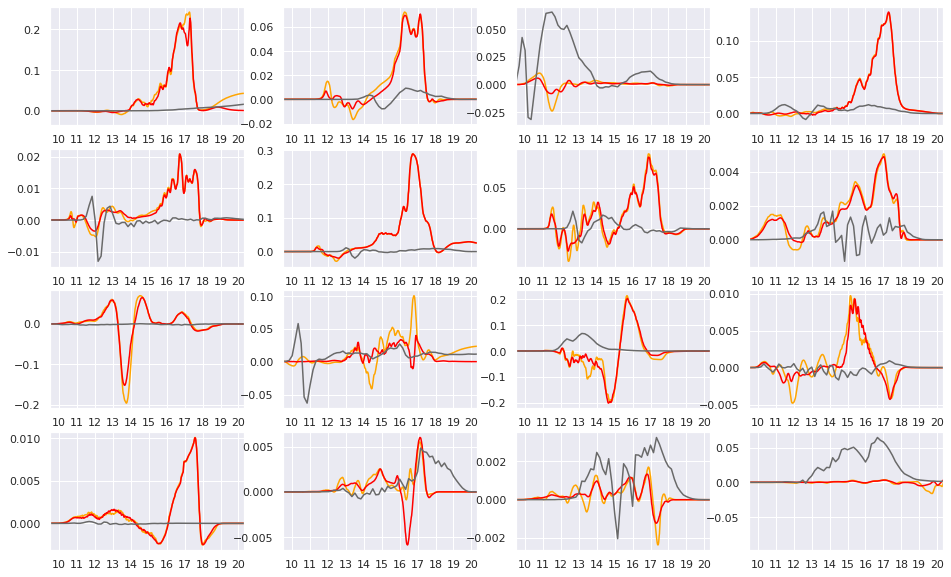

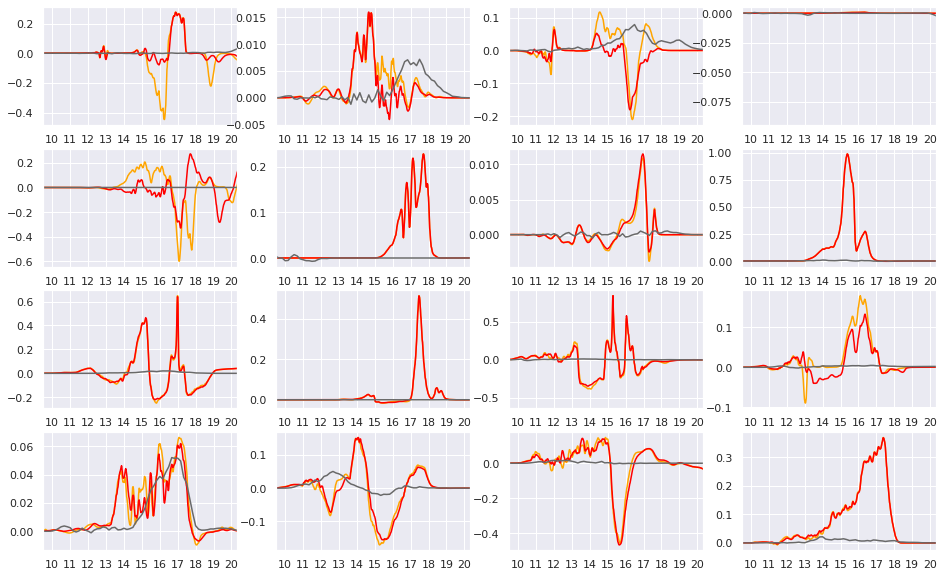

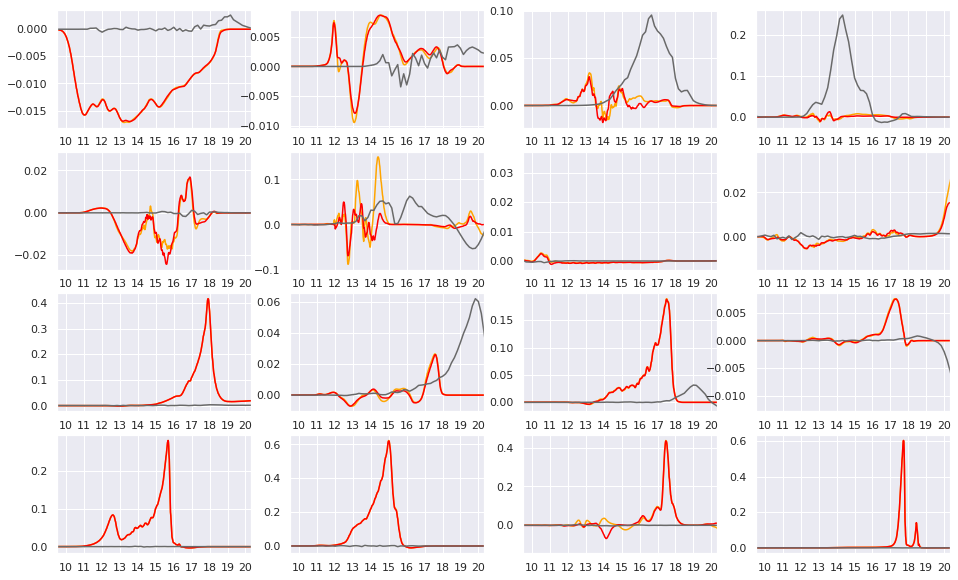

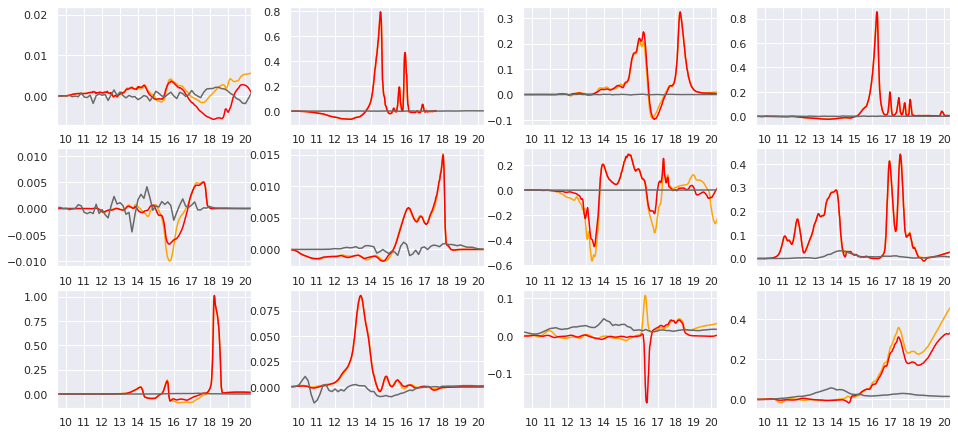

In [29]:
###########################################
#### CHECK NEW SCM RUN DIFFERENCE PLOT ####
###########################################

plt.figure(figsize=(16,10))
i=1

for day in daylist:
    if i==17:
        i=1
        plt.figure(figsize=(16,10))
    plt.subplot(4,4,i)
    i = i+1
    
    fp1c=nc.Dataset(clubb_dir+'sgp_1c/'+day+'/k_1/c_1/output/arm_sfc.nc','r')
    fp2c=nc.Dataset(clubb_dir+'sgp_nocpl_m/'+day+'/k_2/agg_outsfc.nc','r')
    fpcpl=nc.Dataset(clubb_dir+'sgp_cpl_m/'+day+'/k_2/agg_outsfc.nc','r')
    
    lwp_1c  = fp1c['lwp'][:,0,0,0]
    lwp_2c  = fp2c['lwp'][:,0,0,0]
    lwp_cpl = fpcpl['lwp'][:,0,0,0]
    
    time_1c  = np.array(times_clb1[0:len(lwp_1c)])
    time_2c  = np.array(times_clb1[0:len(lwp_2c)])
    time_cpl = np.array(times_clb1[0:len(lwp_cpl)])
    
    if len(time_1c)==len(time_cpl):
        plt.plot(time_1c,lwp_cpl-lwp_1c,color='orange')
    else:
        minl=min(len(time_1c),len(time_cpl))
        plt.plot(time_1c[0:minl],lwp_cpl[0:minl]-lwp_1c[0:minl],color='orange')
    if len(time_2c)==len(time_cpl):
        plt.plot(time_2c,lwp_cpl-lwp_2c,color='red')
    else:
        minl=min(len(time_2c),len(time_cpl))
        plt.plot(time_2c[0:minl],lwp_cpl[0:minl]-lwp_2c[0:minl],color='red')
    
    #LES
    fphmg=nc.Dataset(les_dir+'trimdoz_'+str(day[4:12])+'_01.nc','r')
    fphet=nc.Dataset(les_dir+'trimdoz_'+str(day[4:12])+'_00.nc','r')
    plt.plot(times_js,fphet['lwp'][:]-fphmg['lwp'][:],'-',color='dimgrey')
    
    plt.xlim(times_js[15],times_js[80])
    
    frame1 = plt.gca()
    frame1.axes.xaxis.set_ticks([times_js[18],times_js[24],times_js[30],times_js[36],times_js[42],times_js[48],times_js[54],times_js[60],times_js[66],times_js[72],times_js[78]])
    frame1.axes.xaxis.set_ticklabels([10,11,12,13,14,15,16,17,18,19,20])

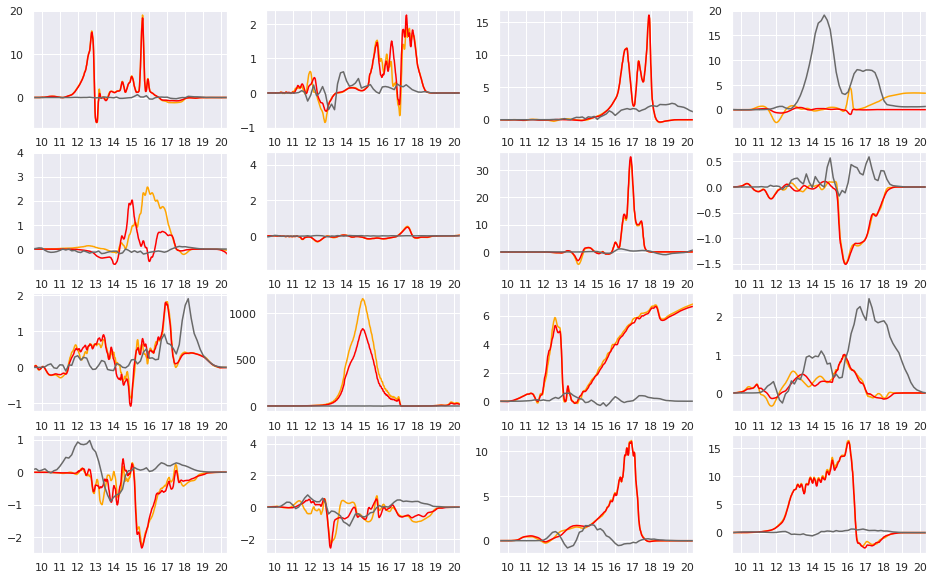

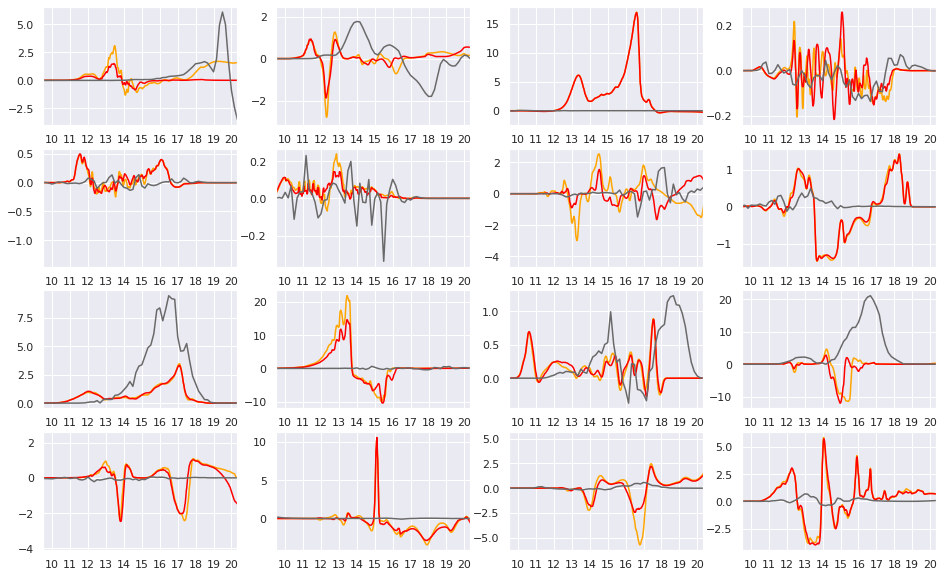

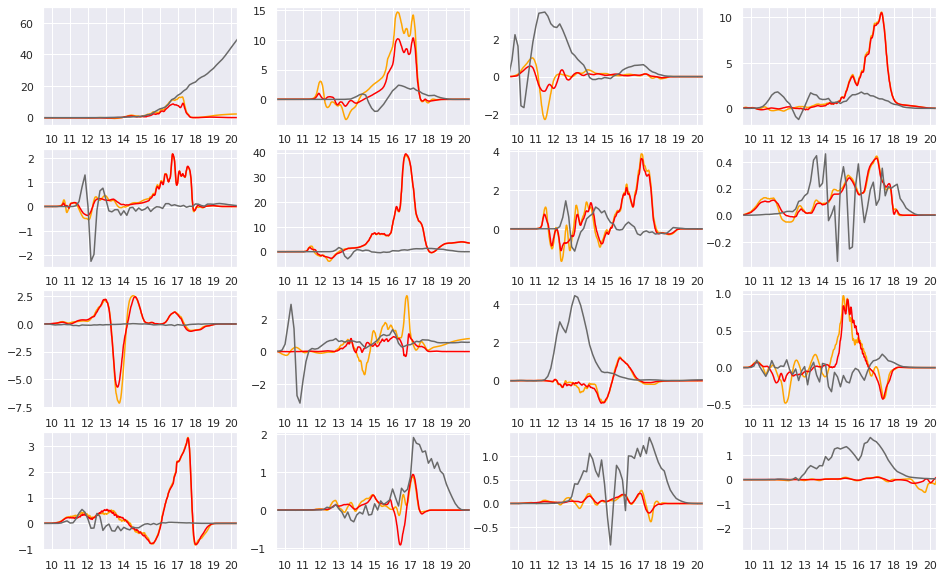

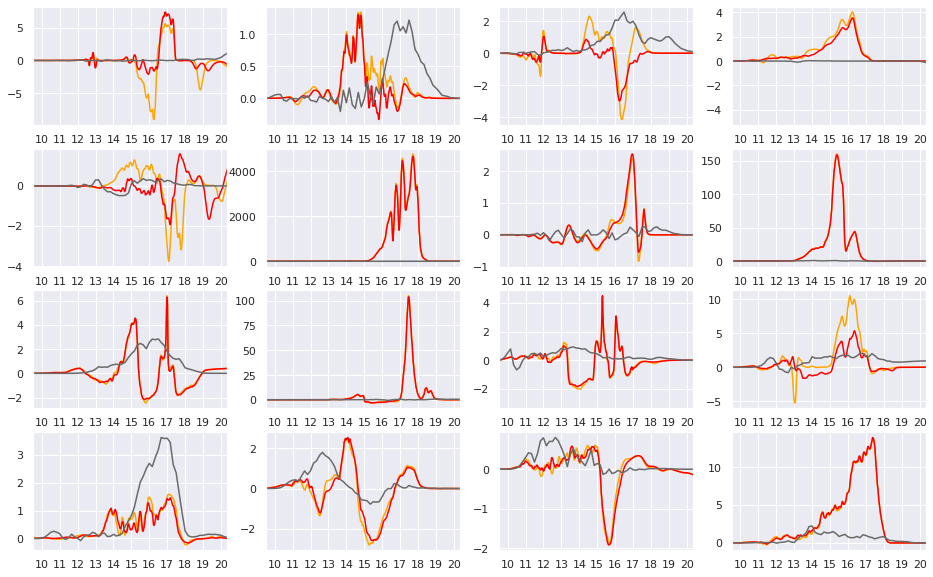

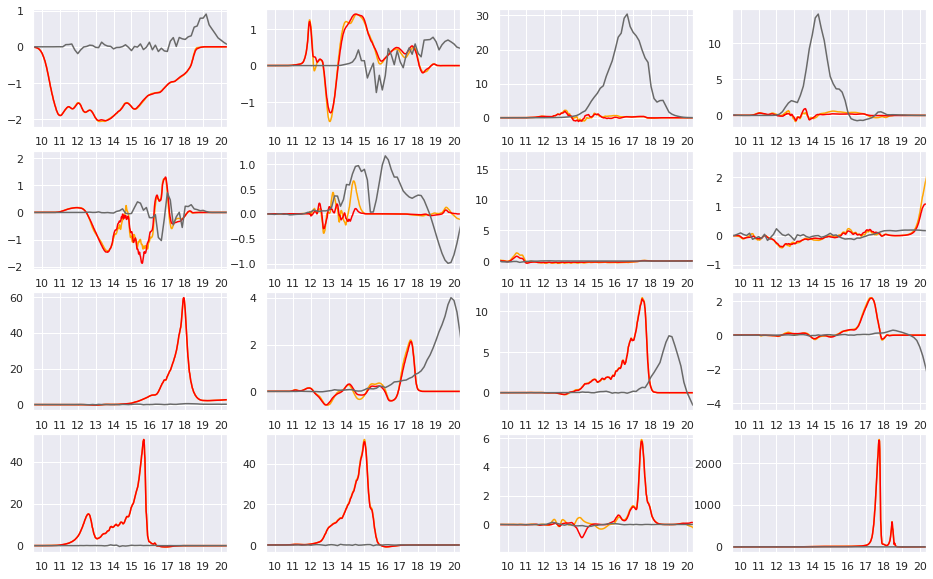

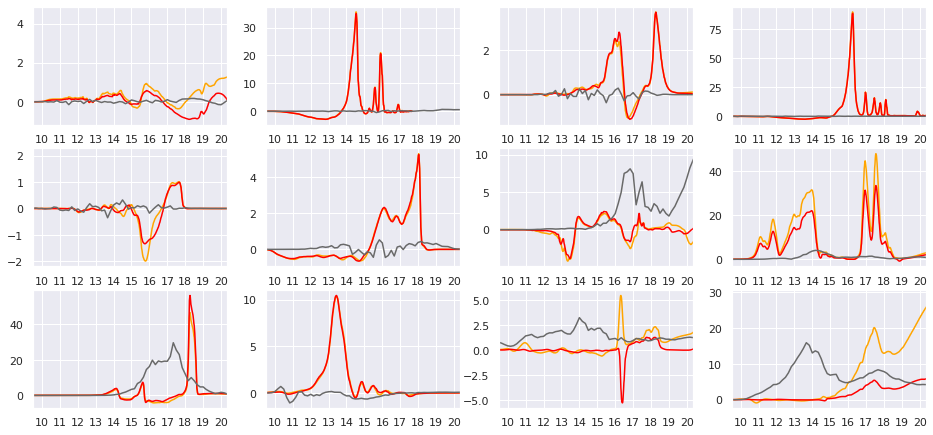

In [31]:
######################################################
#### CHECK NEW SCM RUN NORMALIZED DIFFERENCE PLOT ####
######################################################

plt.figure(figsize=(16,10))
i=1

for day in daylist:
    if i==17:
        i=1
        plt.figure(figsize=(16,10))
    plt.subplot(4,4,i)
    i = i+1
    
    fp1c=nc.Dataset(clubb_dir+'sgp_1c/'+day+'/k_1/c_1/output/arm_sfc.nc','r')
    fp2c=nc.Dataset(clubb_dir+'sgp_nocpl_m/'+day+'/k_2/agg_outsfc.nc','r')
    fpcpl=nc.Dataset(clubb_dir+'sgp_cpl_m/'+day+'/k_2/agg_outsfc.nc','r')
    
    lwp_1c  = fp1c['lwp'][:,0,0,0]
    lwp_2c  = fp2c['lwp'][:,0,0,0]
    lwp_cpl = fpcpl['lwp'][:,0,0,0]
    
    time_1c  = np.array(times_clb1[0:len(lwp_1c)])
    time_2c  = np.array(times_clb1[0:len(lwp_2c)])
    time_cpl = np.array(times_clb1[0:len(lwp_cpl)])
    
    if len(time_1c)==len(time_cpl):
        plt.plot(time_1c,(lwp_cpl-lwp_1c)/np.mean(lwp_1c),color='orange')
    else:
        minl=min(len(time_1c),len(time_cpl))
        plt.plot(time_1c[0:minl],(lwp_cpl[0:minl]-lwp_1c[0:minl])/np.mean(lwp_1c[0:minl]),color='orange')
    if len(time_2c)==len(time_cpl):
        plt.plot(time_2c,(lwp_cpl-lwp_2c)/np.mean(lwp_2c),color='red')
    else:
        minl=min(len(time_2c),len(time_cpl))
        plt.plot(time_2c[0:minl],(lwp_cpl[0:minl]-lwp_2c[0:minl])/np.mean(lwp_2c[0:minl]),color='red')
    
    #LES
    fphmg=nc.Dataset(les_dir+'trimdoz_'+str(day[4:12])+'_01.nc','r')
    fphet=nc.Dataset(les_dir+'trimdoz_'+str(day[4:12])+'_00.nc','r')
    plt.plot(times_js,(fphet['lwp'][:]-fphmg['lwp'][:])/np.mean(fphmg['lwp'][:]),'-',color='dimgrey')
    
    plt.xlim(times_js[15],times_js[80])
    
    frame1 = plt.gca()
    frame1.axes.xaxis.set_ticks([times_js[18],times_js[24],times_js[30],times_js[36],times_js[42],times_js[48],times_js[54],times_js[60],times_js[66],times_js[72],times_js[78]])
    frame1.axes.xaxis.set_ticklabels([10,11,12,13,14,15,16,17,18,19,20])

In [77]:
def calc_blh(ri_,alt_):
    blh=np.zeros((ri_.shape[0],))
    for t in range(ri_.shape[0]):
        
        try:
            wheres=np.where(ri_[t,:]>.25)[0]
            idx=wheres[0]
            if (idx<=3)&(len(wheres)>=2):
                idx=wheres[1]
            if (idx<=3)&(len(wheres)>=3):
                idx=wheres[2]
            if (idx<=3)&(len(wheres)>=4):
                idx=wheres[3]
            blh[t]=alt_[idx]
        except:
            pass
    return blh

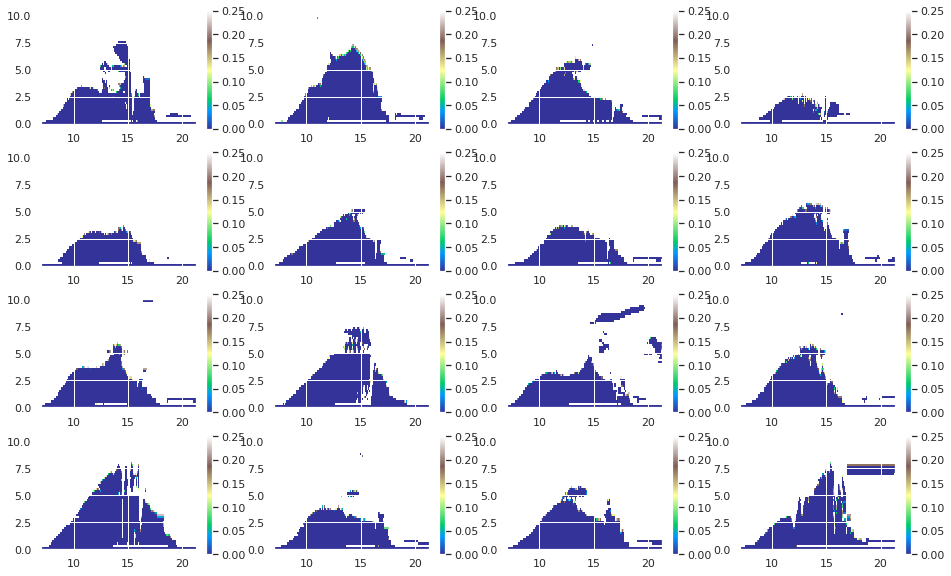

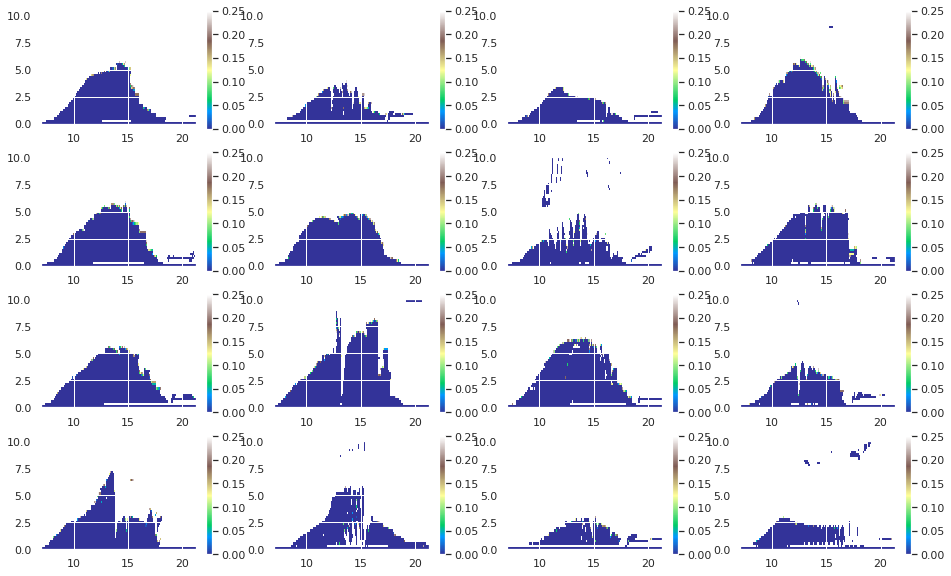

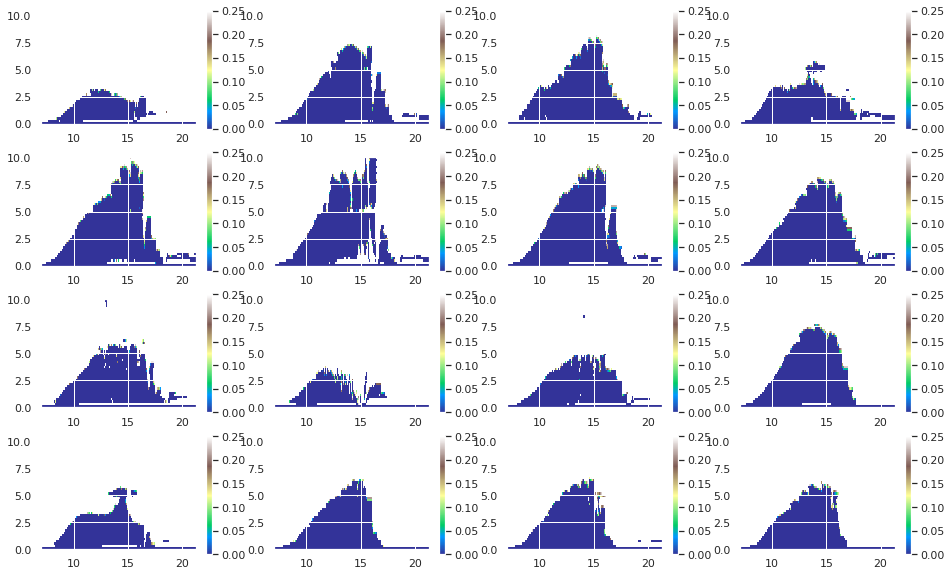

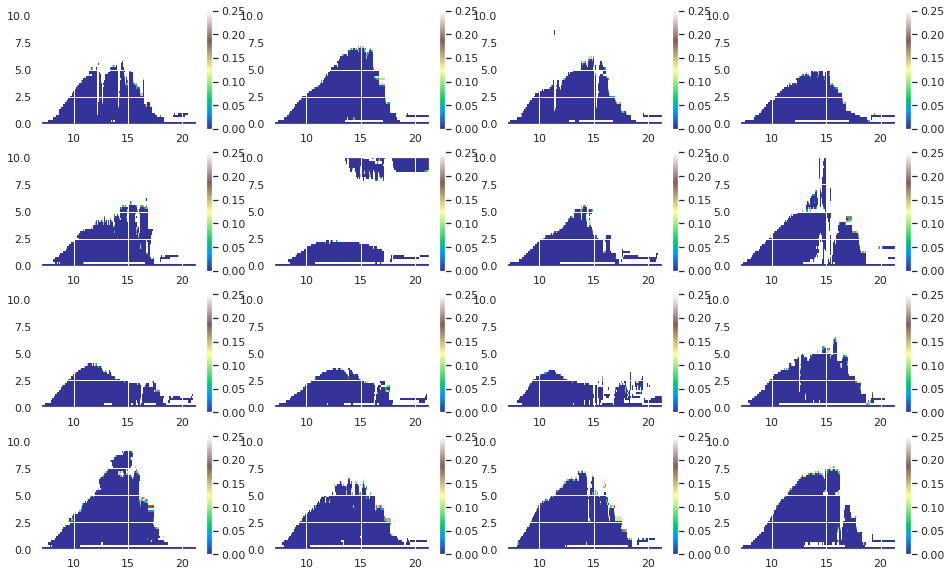

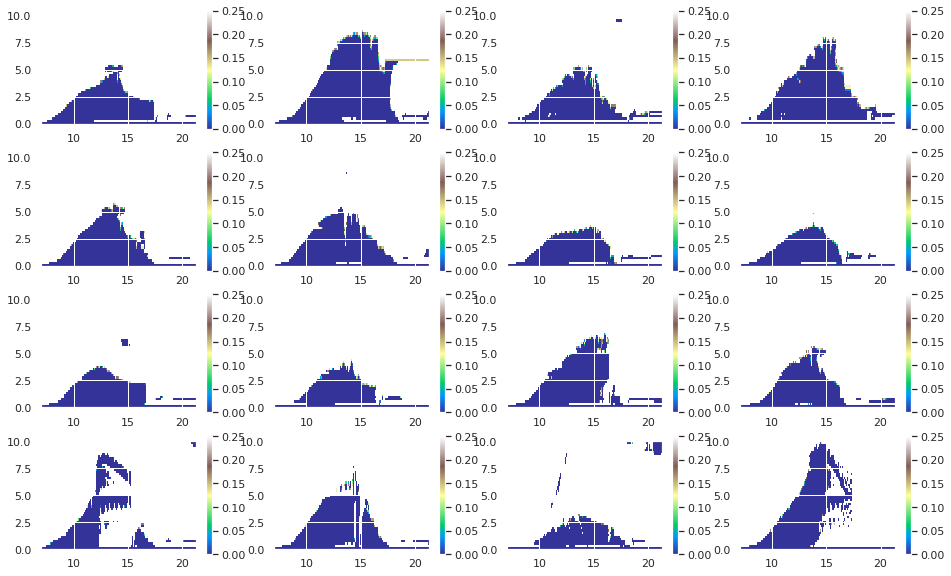

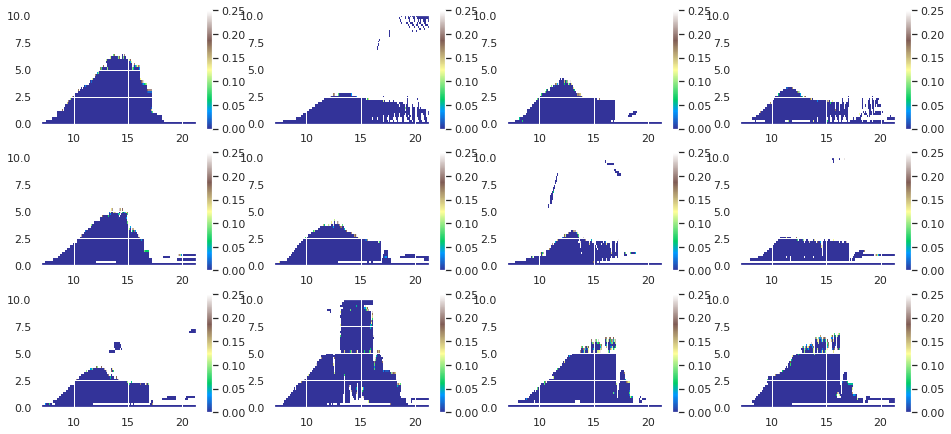

In [86]:
############################
#### PLOT BLH #############
##########################
plt.figure(figsize=(16,10))
i=1

for day in daylist:
    if i==17:
        i=1
        plt.figure(figsize=(16,10))
    plt.subplot(4,4,i)
    i = i+1
    
    fp1c=nc.Dataset(clubb_dir+'sgp_1c/'+day+'/k_1/c_1/output/arm_zm.nc','r')
    fp2c1=nc.Dataset(clubb_dir+'sgp_nocpl_m/'+day+'/k_2/c_1/output/arm_zm.nc','r')
    fp2c2=nc.Dataset(clubb_dir+'sgp_nocpl_m/'+day+'/k_2/c_2/output/arm_zm.nc','r')
    fpcpl1=nc.Dataset(clubb_dir+'sgp_cpl_m/'+day+'/k_2/c_1/output/arm_zm.nc','r')
    fpcpl2=nc.Dataset(clubb_dir+'sgp_cpl_m/'+day+'/k_2/c_2/output/arm_zm.nc','r')
    
    ri_1c  = fp1c['Richardson_num'][:,:,0,0]
    ri_2c1  = fp2c1['Richardson_num'][:,:,0,0]
    ri_2c2  = fp2c2['Richardson_num'][:,:,0,0]
    ri_cpl1 = fpcpl1['Richardson_num'][:,:,0,0]
    ri_cpl2 = fpcpl2['Richardson_num'][:,:,0,0]
    alt    = fp1c['altitude'][:]
    
    
    min2c=min(len(ri_2c1[:,0]),len(ri_2c2[:,0]))
    mincpl=min(len(ri_cpl1[:,0]),len(ri_cpl2[:,0]))
    time_1c  = np.array(times_clb1[0:len(ri_1c[:,0])])
    time_2c  = np.array(times_clb1[0:min2c])
    time_cpl = np.array(times_clb1[0:mincpl])
    
    plt.imshow(np.transpose(ri_cpl1[:,0:50]),vmin=0,vmax=.25,cmap='terrain',origin='lower',extent=[7,860/60+7,0,10])
    plt.colorbar()
    
    #blh_1c=calc_blh(ri_1c,alt)
    #blh_2c=(calc_blh(ri_2c1[0:min2c,:],alt)+calc_blh(ri_2c2[0:min2c,:],alt))/2
    #blh_cpl=(calc_blh(ri_cpl1[0:mincpl,:],alt)+calc_blh(ri_cpl2[0:mincpl,:],alt))/2
    
    #plt.plot(time_1c,blh_1c,'b--')
    #plt.plot(time_2c,blh_2c,'b-')
    #plt.plot(time_cpl,blh_cpl,'r-')
    
    #plt.xlim(times_js[15],times_js[80])
    
    #frame1 = plt.gca()
    #frame1.axes.xaxis.set_ticks([times_js[18],times_js[24],times_js[30],times_js[36],times_js[42],times_js[48],times_js[54],times_js[60],times_js[66],times_js[72],times_js[78]])
    #frame1.axes.xaxis.set_ticklabels([10,11,12,13,14,15,16,17,18,19,20])

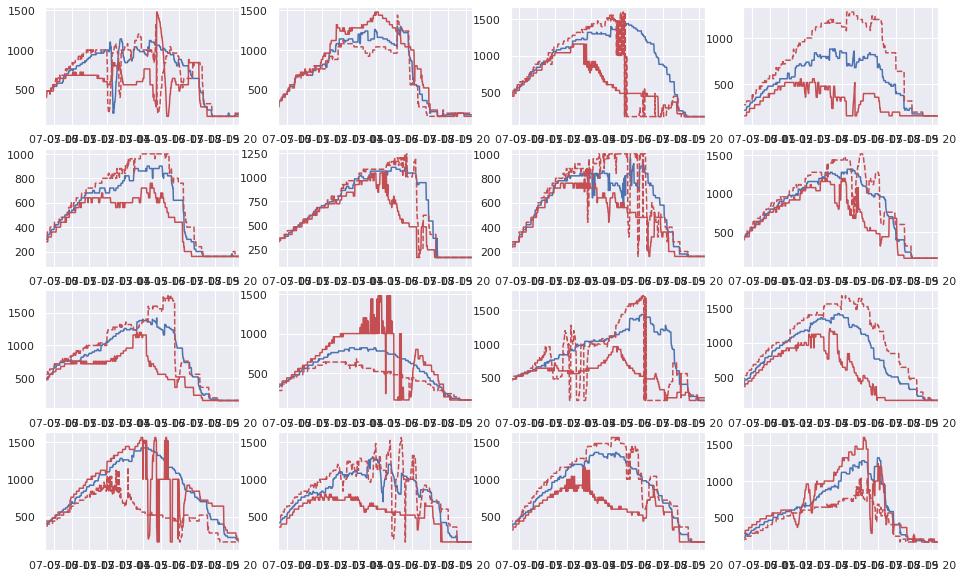

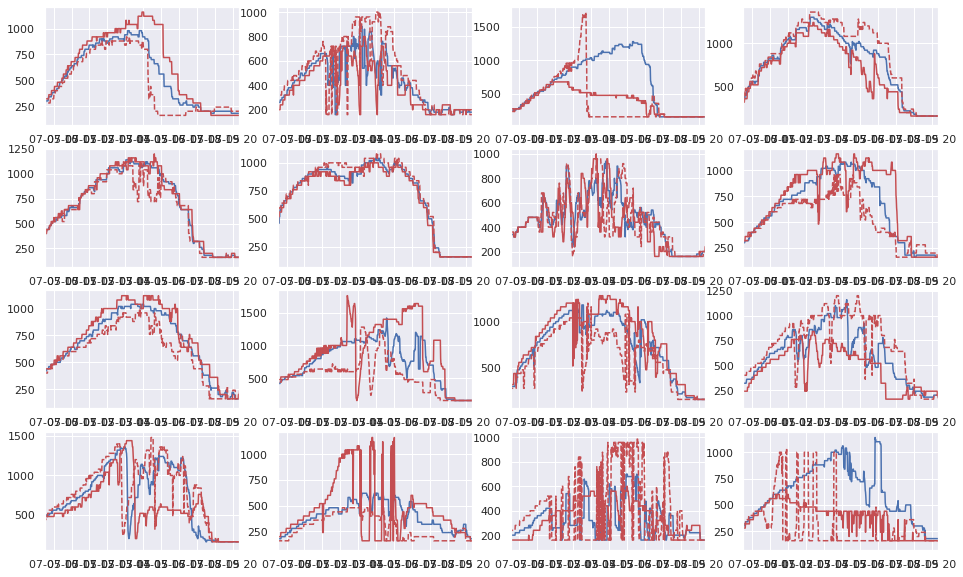

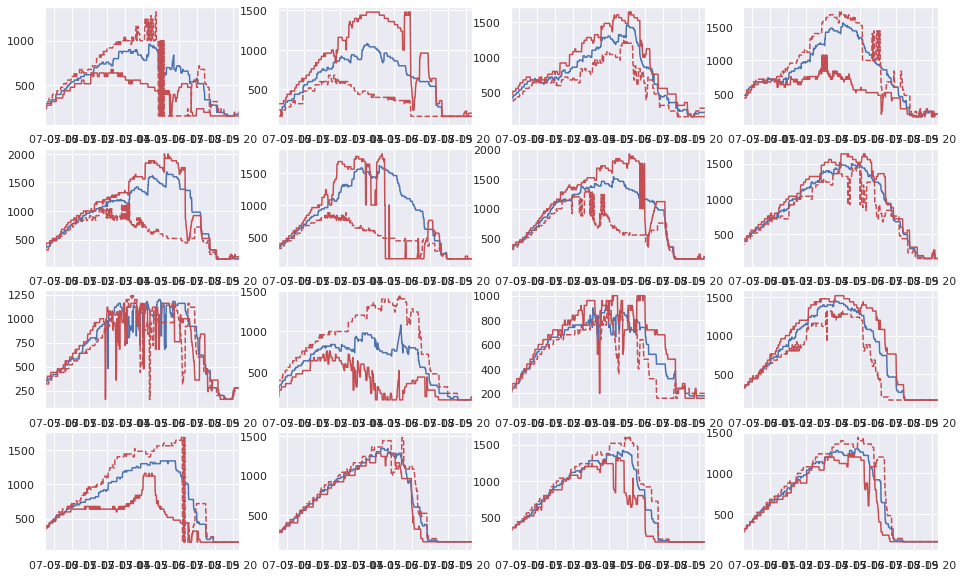

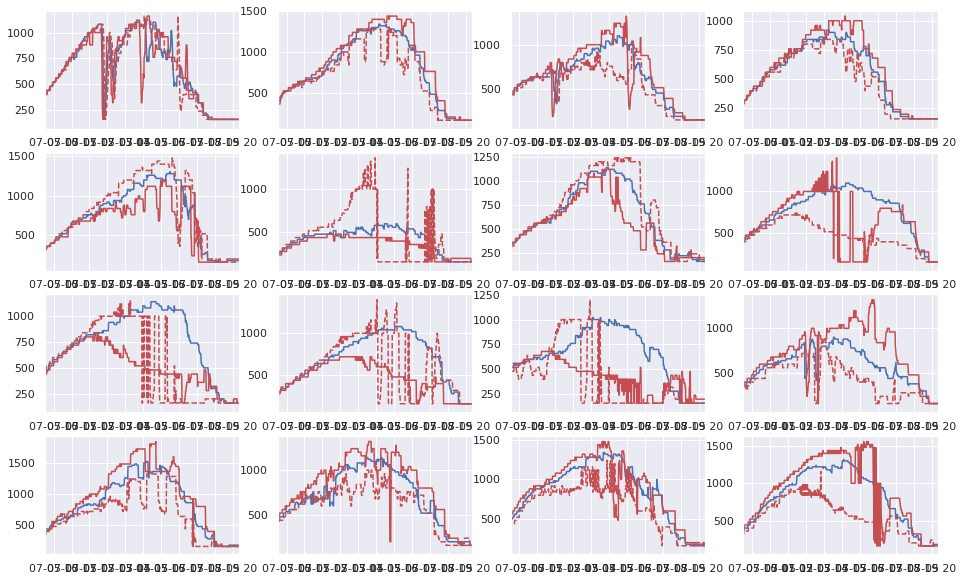

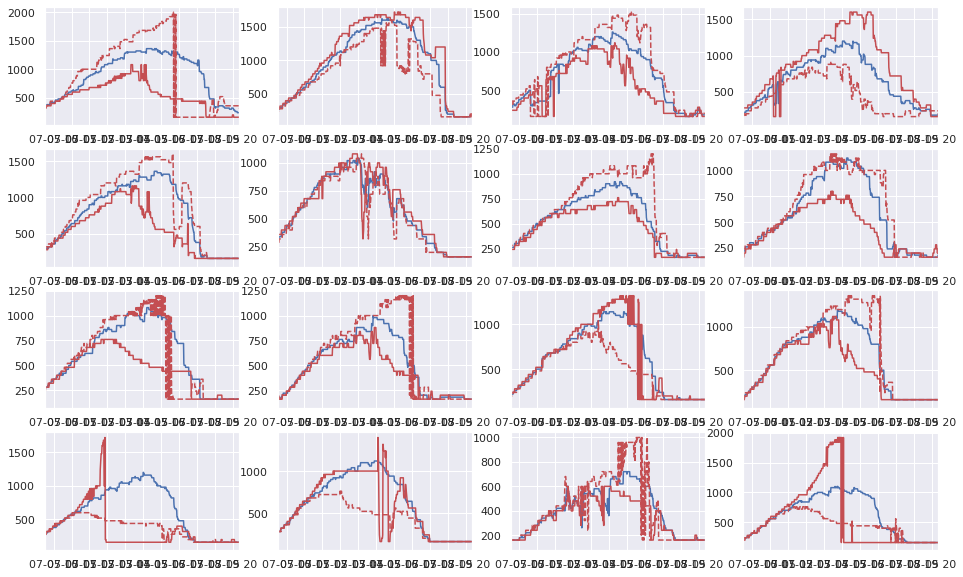

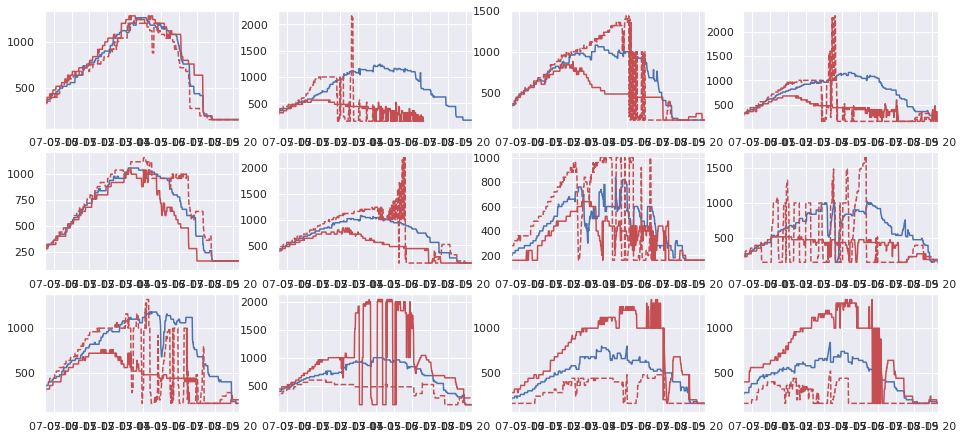

In [87]:
############################
#### PLOT BLH #############
##########################
plt.figure(figsize=(16,10))
i=1

for day in daylist:
    if i==17:
        i=1
        plt.figure(figsize=(16,10))
    plt.subplot(4,4,i)
    i = i+1
    
    fp1c=nc.Dataset(clubb_dir+'sgp_1c/'+day+'/k_1/c_1/output/arm_sfc.nc','r')
    fp2c1=nc.Dataset(clubb_dir+'sgp_nocpl_m/'+day+'/k_2/c_1/output/arm_sfc.nc','r')
    fp2c2=nc.Dataset(clubb_dir+'sgp_nocpl_m/'+day+'/k_2/c_2/output/arm_sfc.nc','r')
    fpcpl1=nc.Dataset(clubb_dir+'sgp_cpl_m/'+day+'/k_2/c_1/output/arm_sfc.nc','r')
    fpcpl2=nc.Dataset(clubb_dir+'sgp_cpl_m/'+day+'/k_2/c_2/output/arm_sfc.nc','r')
    fp2c=nc.Dataset(clubb_dir+'sgp_nocpl_m/'+day+'/k_2/agg_outsfc.nc','r')
    
    #plt.imshow(np.transpose(ri_1c[:,0:10]),vmin=0,vmax=.25,cmap='terrain',origin='lower',extent=[7,860/60+7,0,10])
    #plt.colorbar()
    

    blh_2c=fp2c['blh'][:,0,0,0]
    blh_cpl1=fpcpl1['blh'][:,0,0,0]
    blh_cpl2=fpcpl2['blh'][:,0,0,0]
    
    min2c=len(blh_2c)
    mincpl=min(len(blh_cpl1[:]),len(blh_cpl2[:]))
    time_2c  = np.array(times_clb1[0:min2c])
    time_cpl = np.array(times_clb1[0:mincpl])
    
    #plt.plot(time_1c,blh_1c,'b--')
    plt.plot(time_2c,blh_2c,'b-')
    plt.plot(time_cpl,blh_cpl1,'r-')
    plt.plot(time_cpl,blh_cpl2,'r--')
    
    plt.xlim(times_js[15],times_js[80])
    
    #frame1 = plt.gca()
    #frame1.axes.xaxis.set_ticks([times_js[18],times_js[24],times_js[30],times_js[36],times_js[42],times_js[48],times_js[54],times_js[60],times_js[66],times_js[72],times_js[78]])
    #frame1.axes.xaxis.set_ticklabels([10,11,12,13,14,15,16,17,18,19,20])

-99.72226344219062

In [88]:
def cts_to_string(cts):
    out=[]
    for ct in cts:
        sp=str(ct).split('0')
        out.append('cr20ct0.000'+sp[4]+'cf0.8')
    return out

In [91]:
###########################
#### LOAD PROFILE DATA ####
###########################

p_data={}

daylist2=os.listdir(clubb_dir+'circ_tune/')
daylist2.sort()

ct_n =np.linspace(.0001,.0004,31)
ct_s= cts_to_string(ct_n) #filename strings
ct_c= plt.cm.YlGnBu(np.linspace(0,1,31)) #colors for lines

p_time = 600 #index in time of profile

for folder in daylist2:
    print(folder)
    p_data[folder]={}
    fp1c_zm=nc.Dataset(clubb_dir+'sgp_1c/sgp_'+folder+'/k_1/c_1/output/arm_zm.nc','r')
    fp2c_zm=nc.Dataset(clubb_dir+'sgp_nocpl_m/sgp_'+folder+'/k_2/agg_outzm.nc','r')
    fp1c_zt=nc.Dataset(clubb_dir+'sgp_1c/sgp_'+folder+'/k_1/c_1/output/arm_zt.nc','r')
    fp2c_zt=nc.Dataset(clubb_dir+'sgp_nocpl_m/sgp_'+folder+'/k_2/agg_outzt.nc','r')
    
    p_data[folder]['1c']={}
    p_data[folder]['2c']={}
    
    p_data[folder]['1c']['thlm']=fp1c_zt['thlm'][p_time,:,0,0]
    p_data[folder]['1c']['altitude']=fp1c_zt['altitude'][:]
    p_data[folder]['1c']['rtm']=fp1c_zt['rtm'][p_time,:,0,0]
    p_data[folder]['1c']['bvf2']=fp1c_zm['bv_freq_sqd'][p_time,:,0,0]
    
    p_data[folder]['2c']['thlm']=fp2c_zt['thlm'][p_time,:,0,0]
    p_data[folder]['2c']['rtm']=fp2c_zt['rtm'][p_time,:,0,0]
    p_data[folder]['2c']['bvf2']=fp2c_zm['bv_freq_sqd'][p_time,:,0,0]
    
    #fpcpl=nc.Dataset(clubb_dir+'sgp_cpl_m/'+day+'/k_2/agg_outsfc.nc','r')
    for i in range(len(ct_s)):
        p_data[folder][ct_n[i]]={}
        f=ct_s[i]
        fpzt=nc.Dataset(clubb_dir+'circ_tune/'+folder+'/'+f+'/k_2/agg_outzt.nc','r')
        fpzm=nc.Dataset(clubb_dir+'circ_tune/'+folder+'/'+f+'/k_2/agg_outzm.nc','r')
        try:
            p_data[folder][ct_n[i]]['thlm']=fpzt['thlm'][p_time,:,0,0]
        except:
            p_data[folder][ct_n[i]]['thlm']=np.zeros((301,))
        try:
            p_data[folder][ct_n[i]]['rtm']=fpzt['rtm'][p_time,:,0,0]
        except:
            p_data[folder][ct_n[i]]['rtm']=np.zeros((301,))
        try:
            p_data[folder][ct_n[i]]['bvf2']=fpzm['bv_freq_sqd'][p_time,:,0,0]
        except:
            p_data[folder][ct_n[i]]['bvf2']=np.zeros((301,))
        

20150606
20150609
20150627
20150801
20150829
20160518
20160530
20160610
20160611
20160614
20160619
20160625
20160716
20160719
20160720
20160818
20160819
20160830
20170403
20170405
20170509
20170524
20170527
20170605
20170609
20170614
20170626
20170627
20170629
20170630
20170704
20170705
20170709
20170712
20170716
20170717
20170719
20170720
20170721
20170725
20170728
20170802
20170826
20170828
20170830
20170922
20170923
20170924
20180514
20180522
20180523
20180529
20180530
20180531
20180606
20180618
20180619
20180704
20180705
20180707
20180709
20180710
20180711
20180712
20180731
20180805
20180809
20180811
20180901
20180902
20180909
20180911
20180914
20180916
20180917
20180918
20181001
20181002
20190404
20190512
20190517
20190607
20190612
20190617
20190626
20190701
20190704
20190707
20190709
20190714
20190804
20190805


array([1.        , 1.        , 0.85098039, 1.        ])

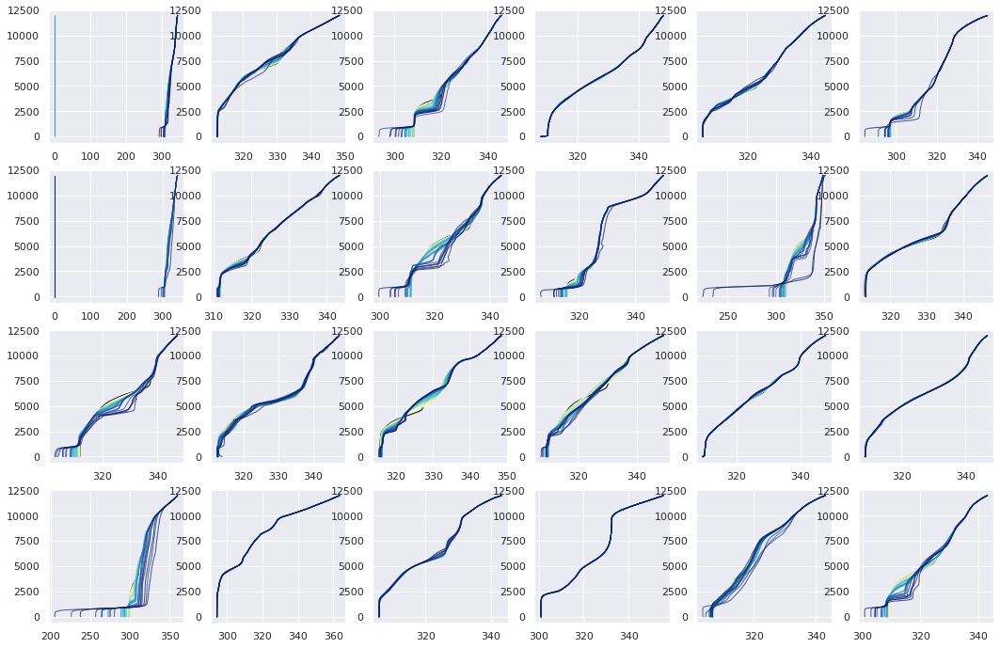

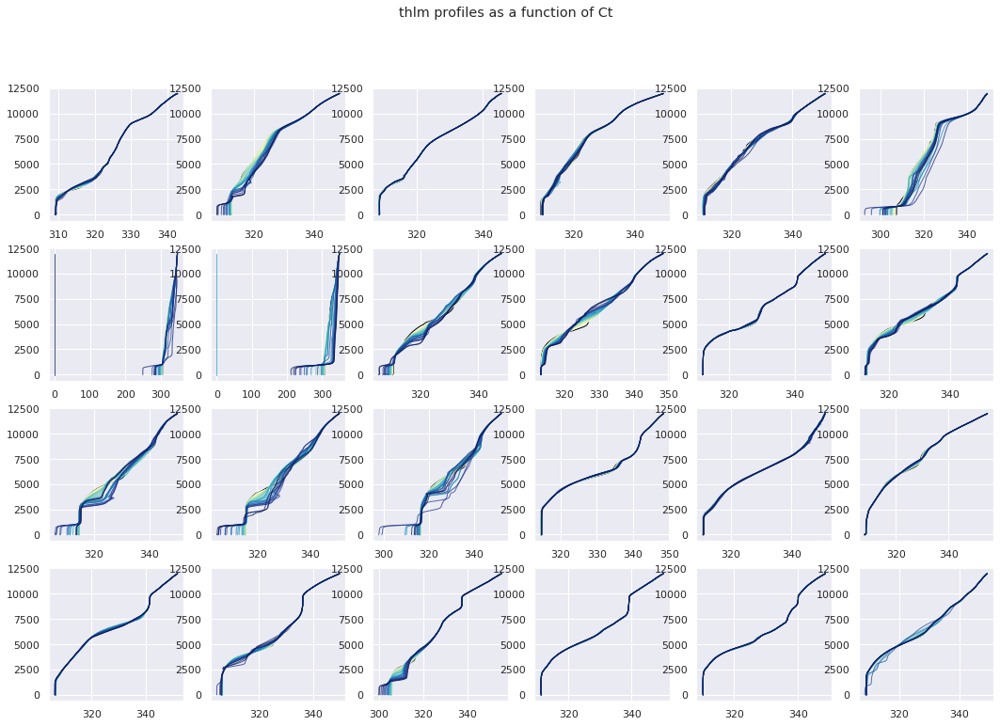

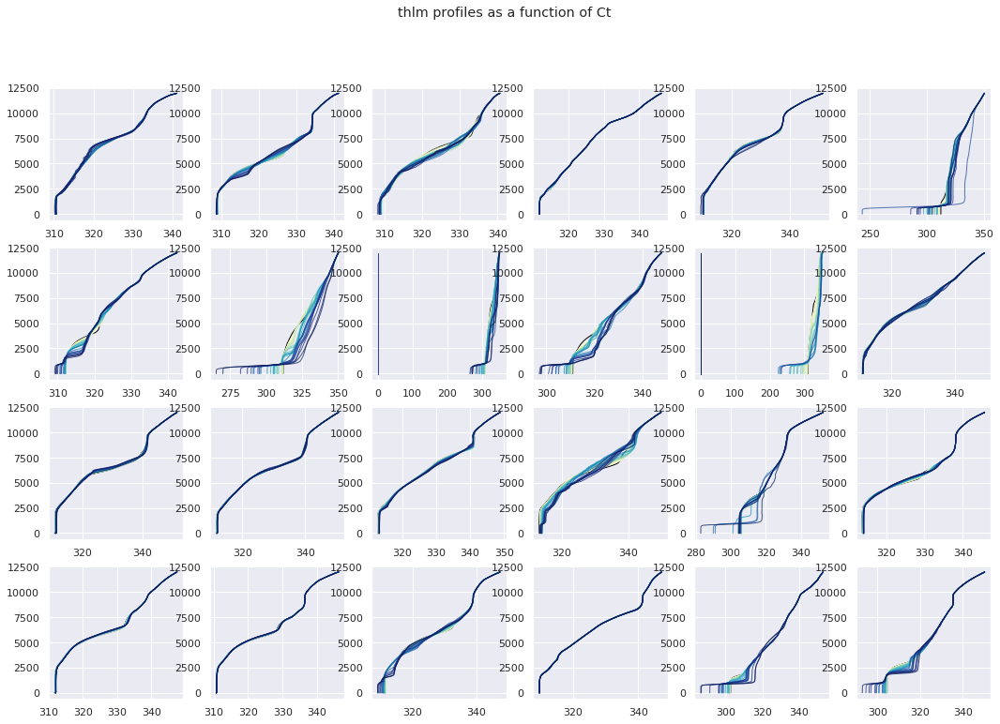

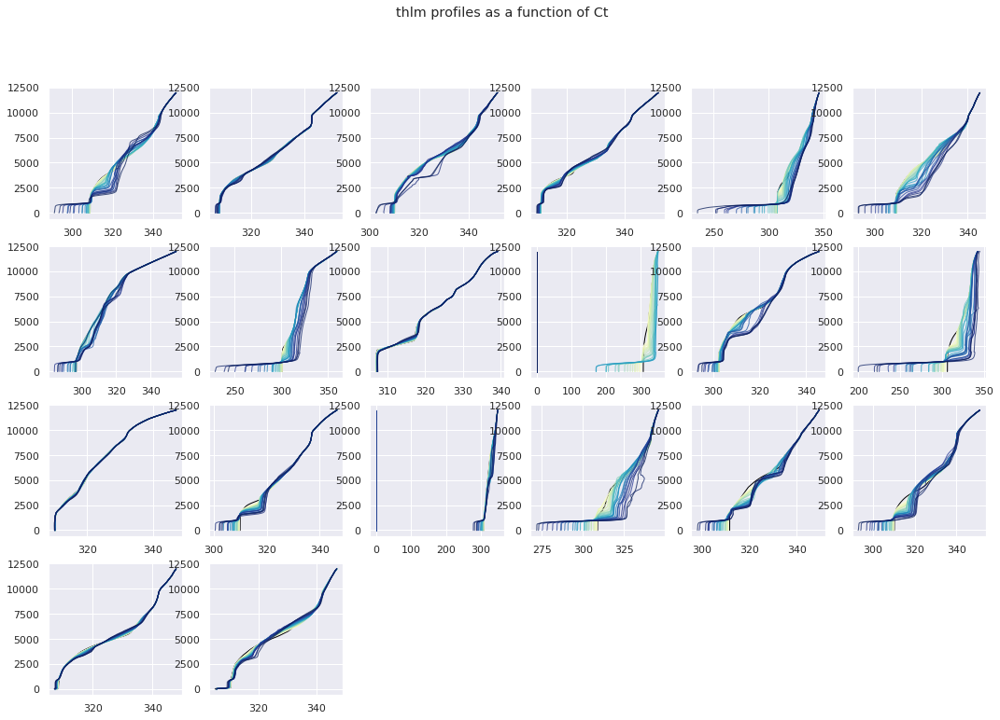

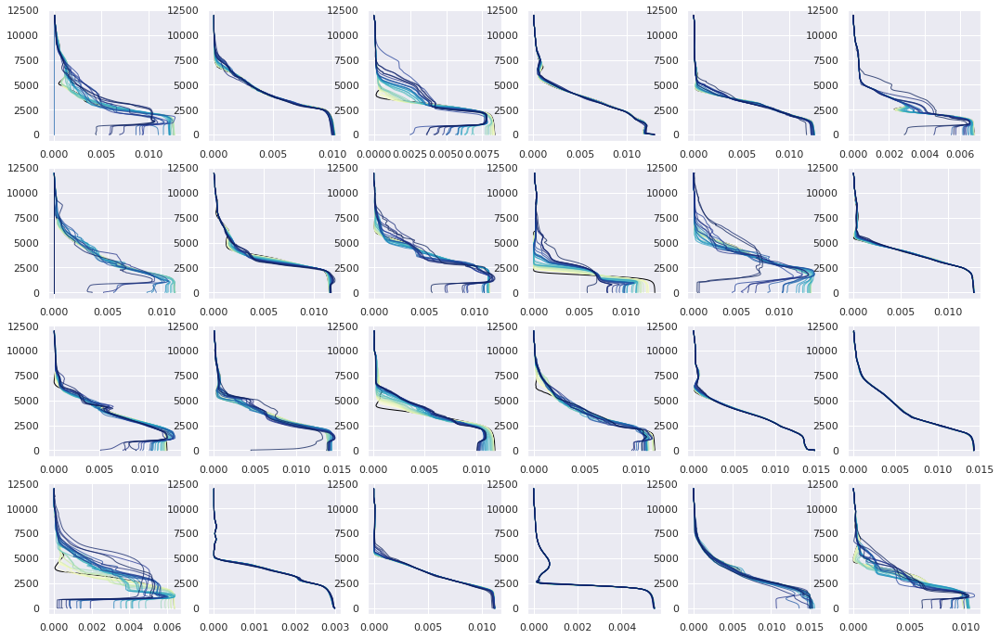

...

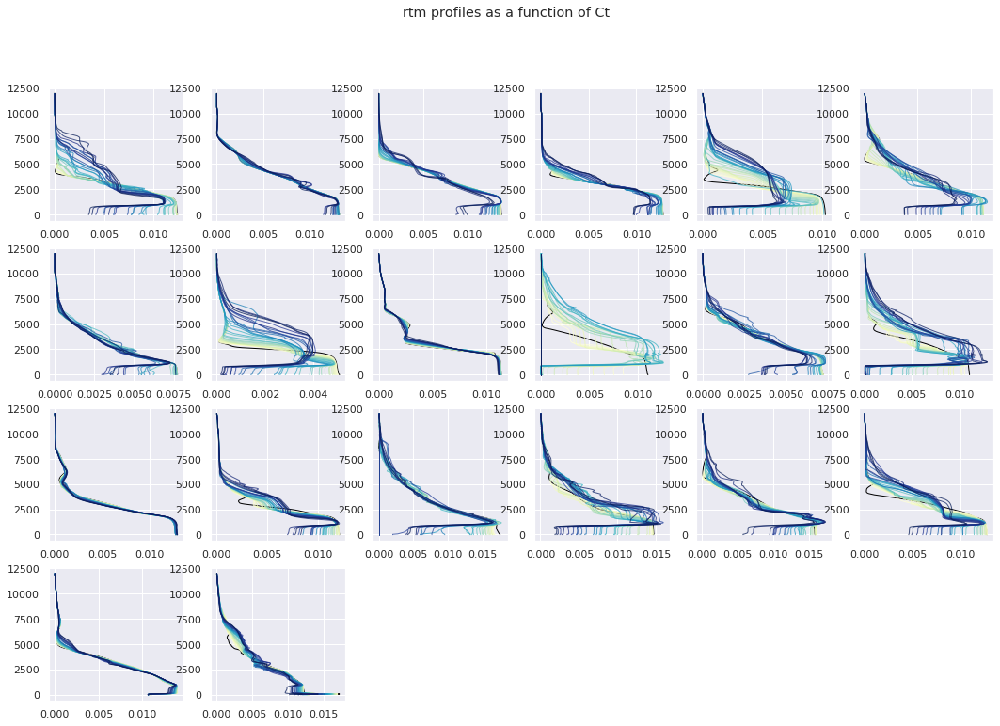

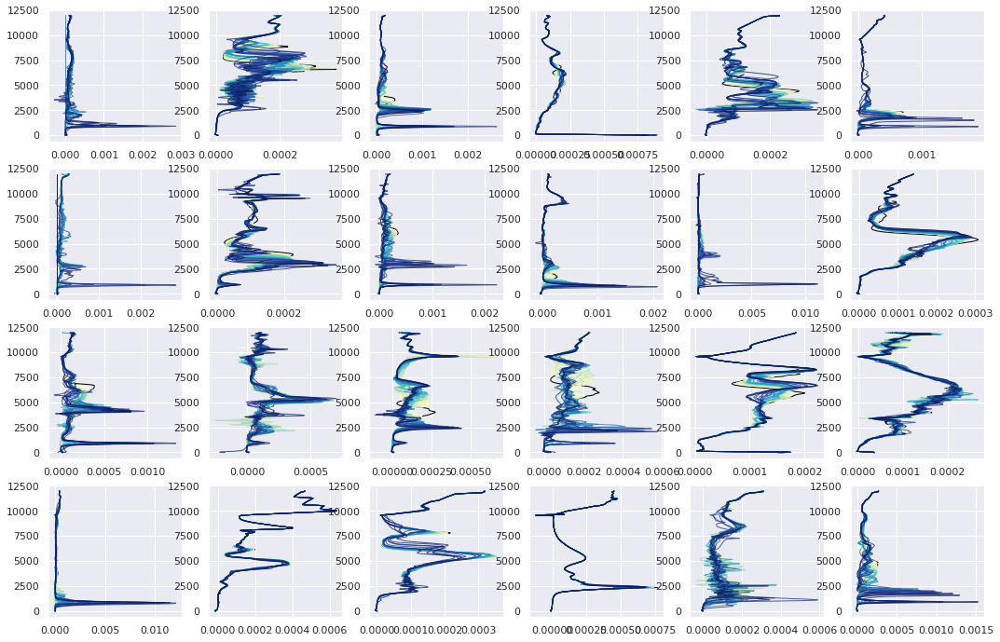

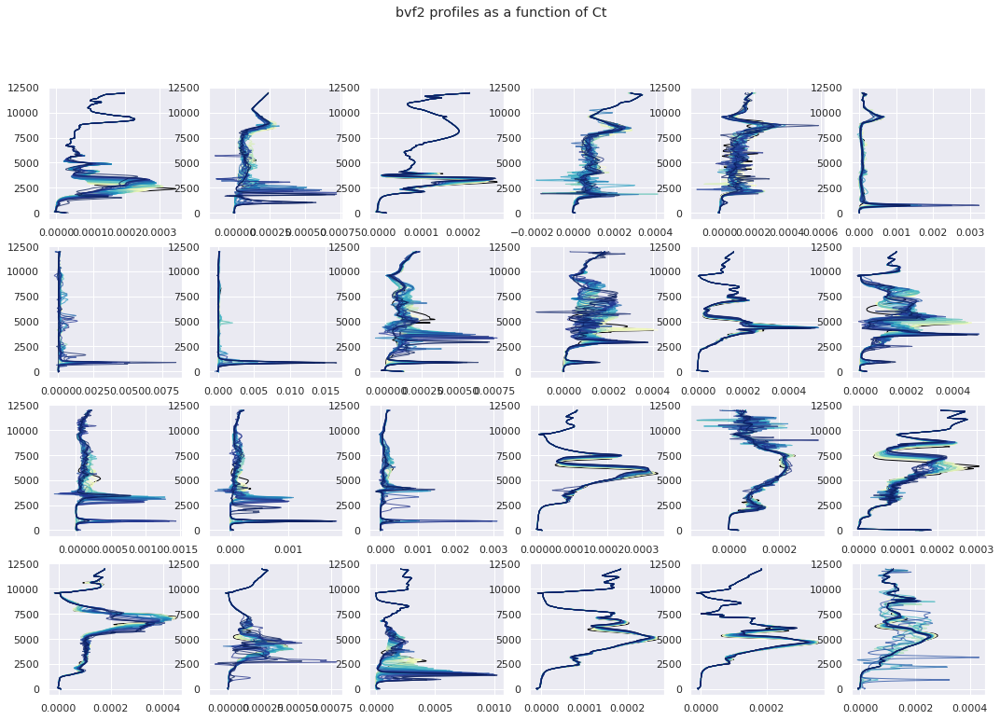

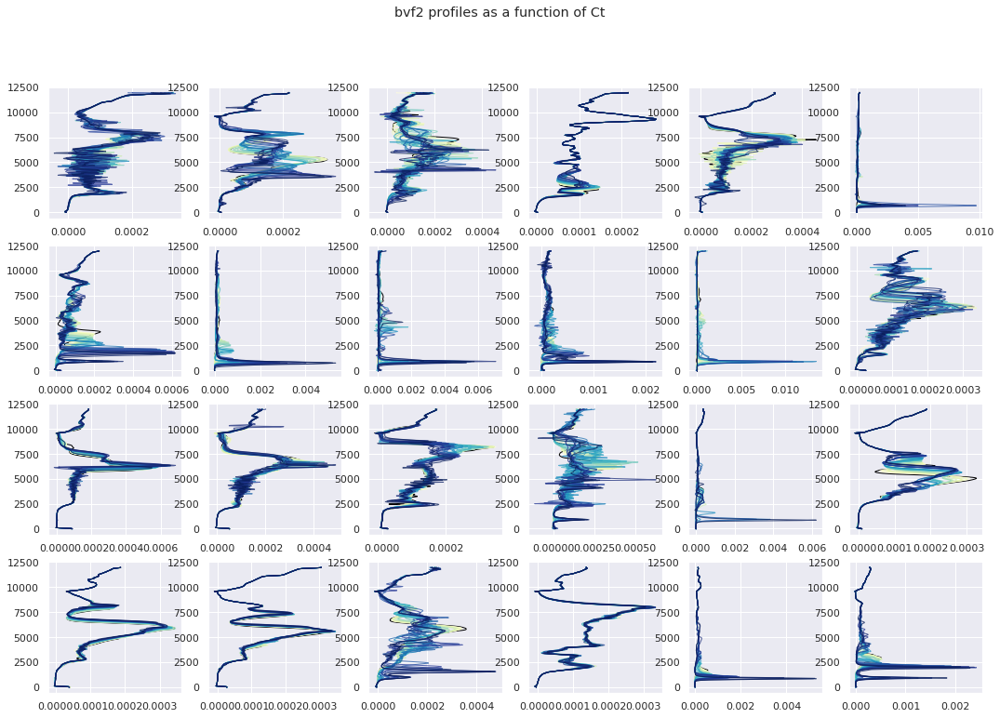

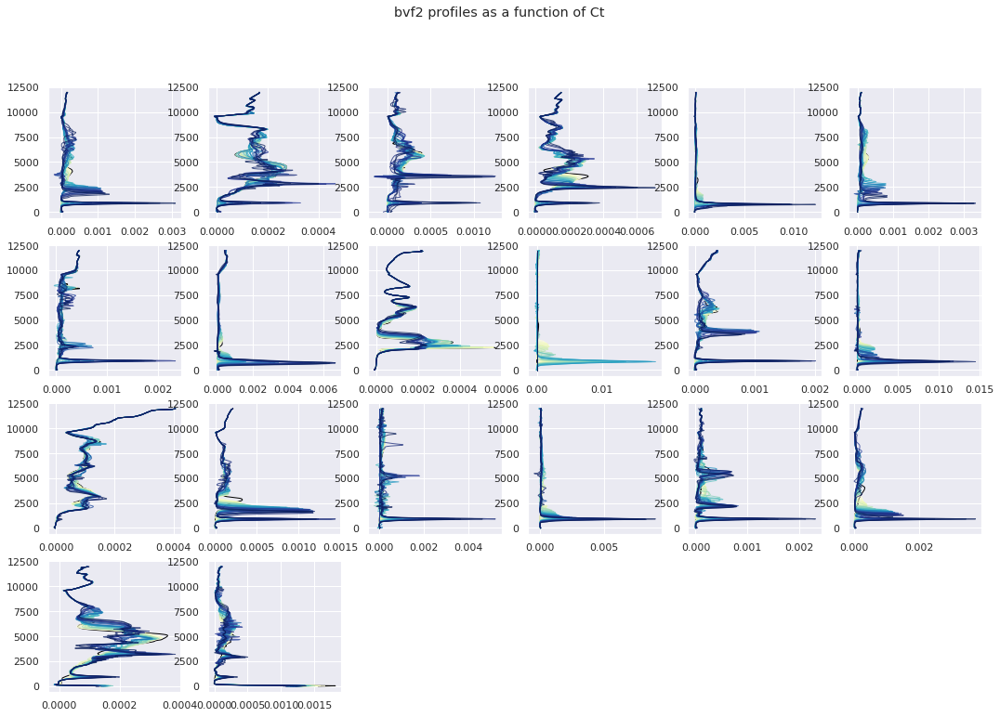

In [94]:
###########################
#### PLOT PROFILE DATA ####
###########################
for var in ['thlm','rtm','bvf2']:
    plt.figure(figsize=(18,12))
    i=1
    for folder in daylist2:
        alt=p_data[folder]['1c']['altitude']
        if i==25:
            plt.figure(figsize=(18,12))
            plt.suptitle(var+' profiles as a function of Ct')
            i=1
        plt.subplot(4,6,i)
        i=i+1
        plt.plot(p_data[folder]['2c'][var][:],alt,color='black',linewidth=1)
        for j in range(len(ct_n)):
            ct=ct_n[j]
            color=ct_c[j]
            plt.plot(p_data[folder][ct][var][:],alt,color=color,linewidth=1,alpha=.75) 

In [213]:
def cts_to_string(cts):
    out=[]
    for ct in cts:
        sp=str(ct).split('0')
        if(len(sp)<4):
            if 'e-04' in str(ct):
                out.append('cr20ct0.000'+str(ct)[0]+'cf0.8')
            elif 'e-05' in str(ct):
                out.append('cr20ct'+str(ct)+'cf0.8')
        else:
            out.append('cr20ct0.000'+sp[4]+'cf0.8')
    return out


In [214]:
ct_n =np.linspace(.00001,.0005,50,dtype='f4')
ct_s= cts_to_string(ct_n) #filename strings
ct_c= plt.cm.YlGnBu(np.linspace(0,1,50)) #colors for lines

In [207]:
dbfile = open('../tdata_base.p', 'rb')     
tdata = pickle.load(dbfile)

<Figure size 1296x216 with 0 Axes>

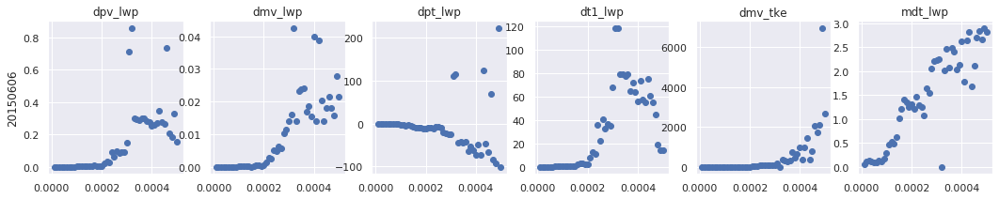

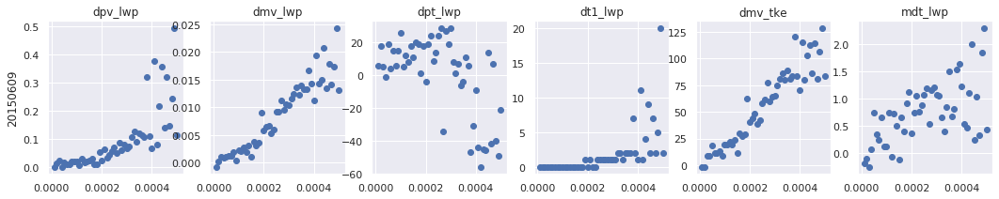

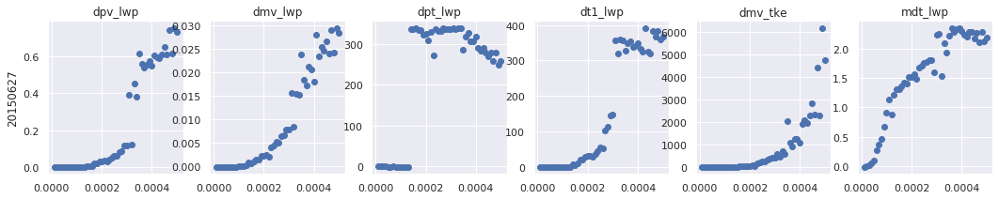

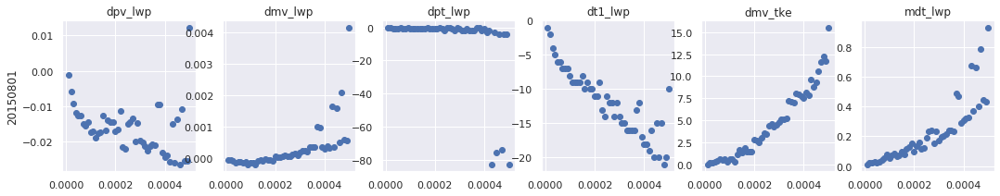

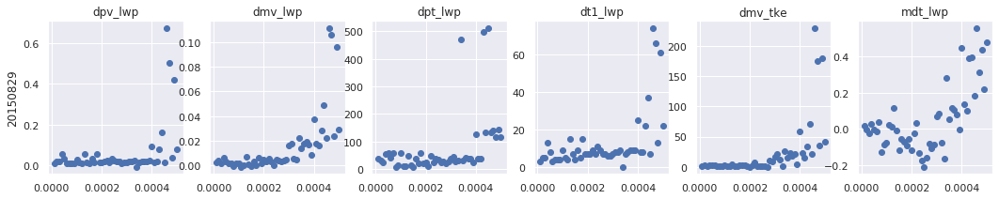

...

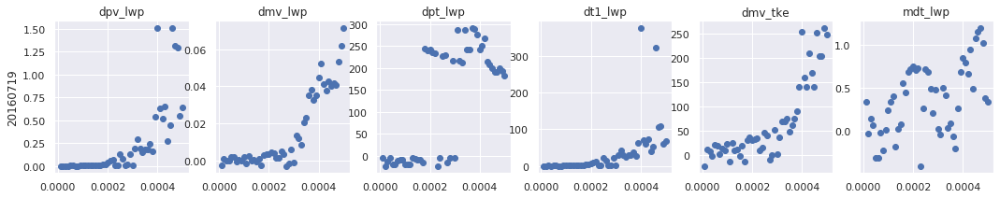

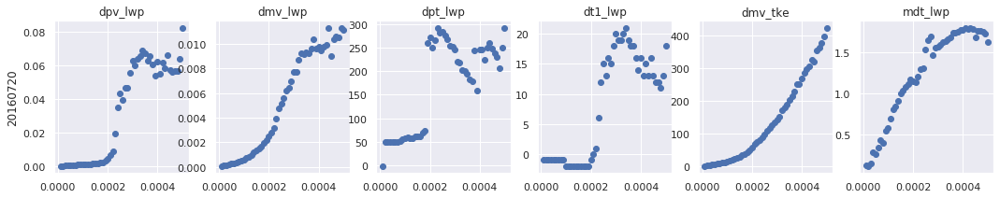

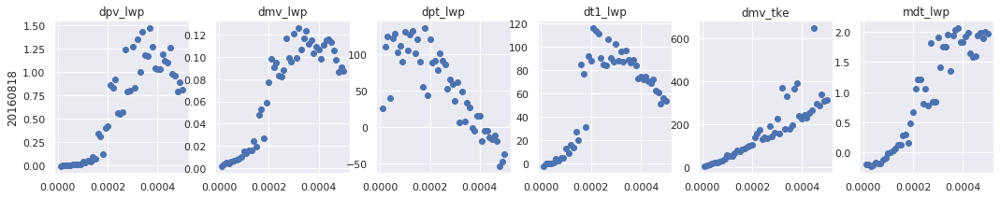

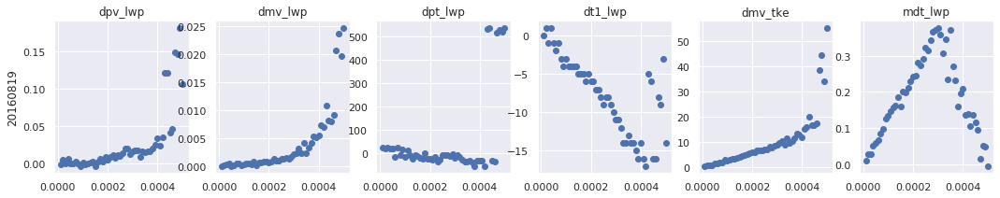

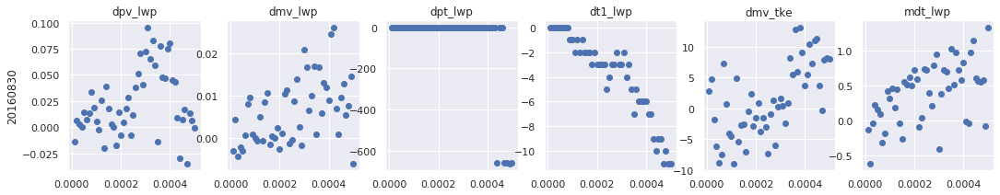

In [215]:
########################
#### PLOT TEST DATA ####
########################
plt.figure(figsize=(18,3))
i=1
for j in range(18):
    plt.figure(figsize=(18,3))
    i=1 
    for test in tests:
        plt.subplot(1,6,i)
        if i == 1:
            plt.ylabel(daylist2[j])
        i=i+1
        plt.plot(ct_n,tdata['tests'][test][j],'o')
        plt.title(test)
    j=j+1

<Figure size 1296x216 with 0 Axes>

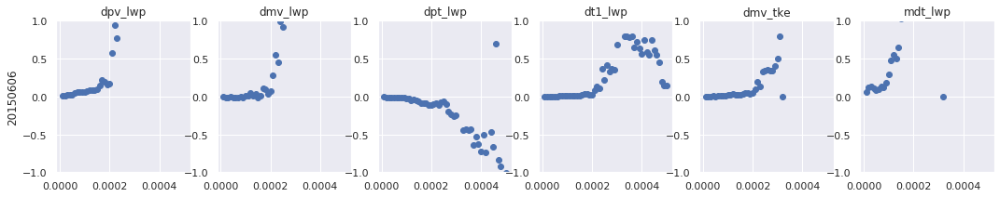

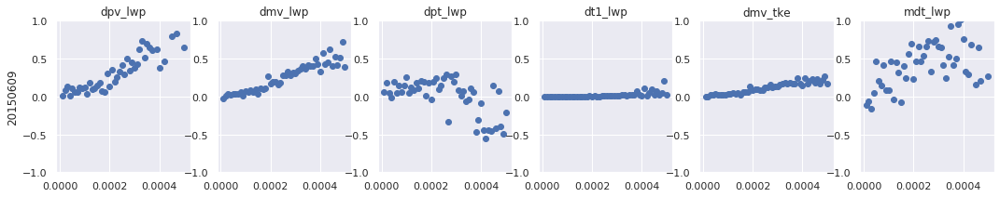

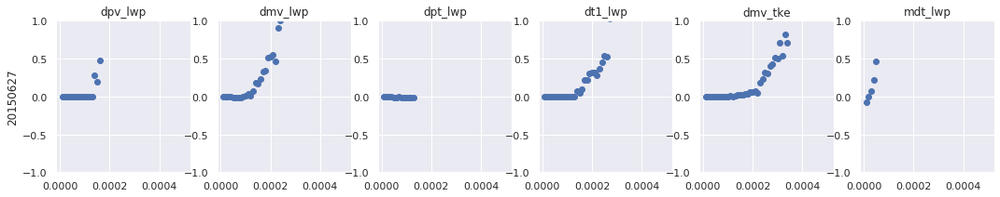

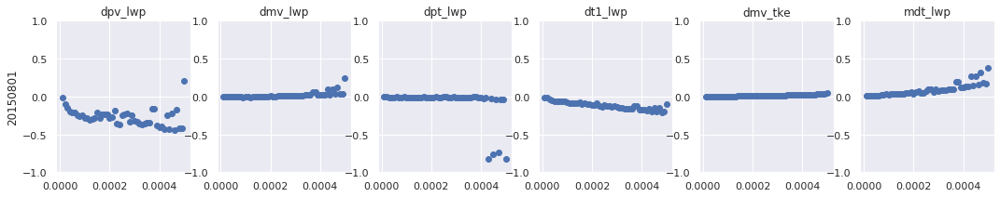

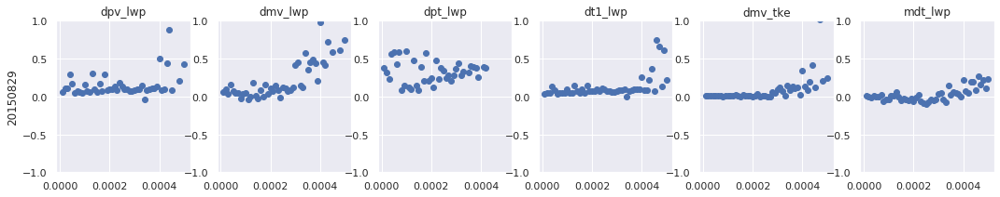

...

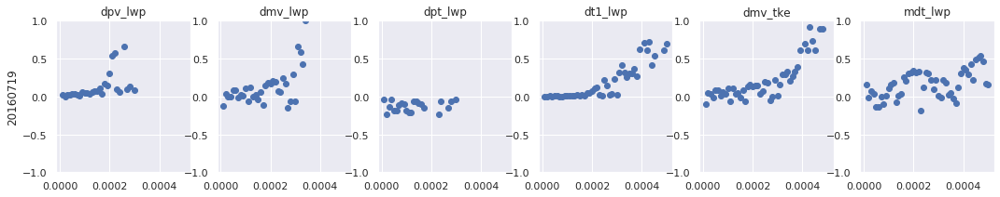

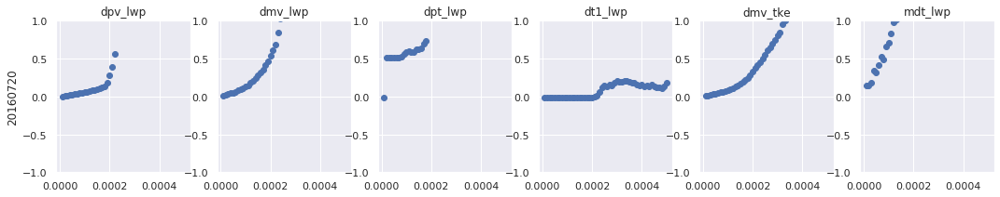

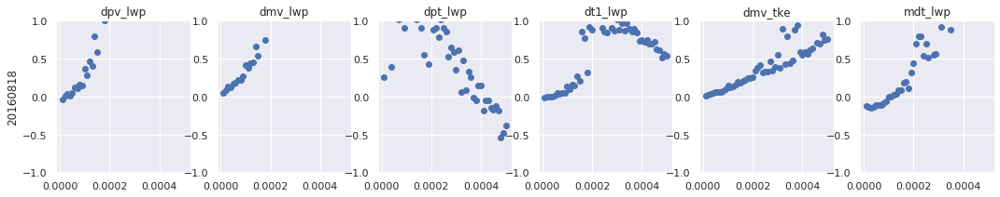

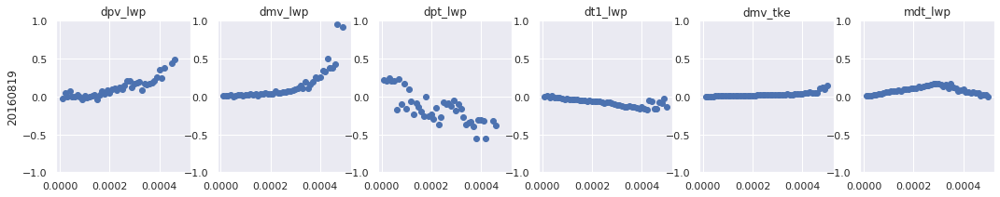

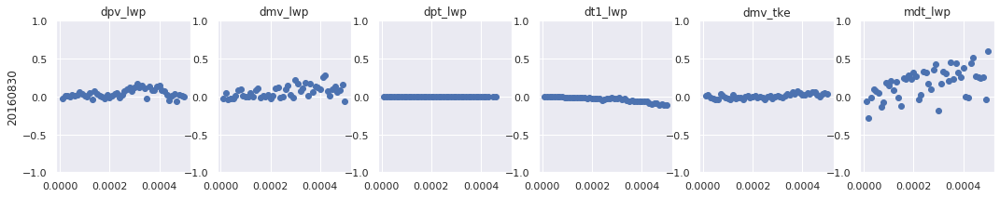

In [216]:
########################
#### PLOT TEST DATA ####
########################
plt.figure(figsize=(18,3))
i=1
for j in range(18):
    plt.figure(figsize=(18,3))
    i=1 
    for test in tests:
        plt.subplot(1,6,i)
        if i == 1:
            plt.ylabel(daylist2[j])
        i=i+1
        plt.plot(ct_n,tdata['ntests'][test][j],'o')
        plt.ylim(-1,1)
        plt.title(test)
    j=j+1

In [167]:
def get_lhet(run_dir):
    fp_=open(run_dir+'/tw_run_param.txt','r')
    for line in fp_:
        if 'l_het' in line:
            return float(line.split(' ')[4])
    return 5

In [255]:
def compute_LE(LE,clst_):
    LEclst=np.zeros((LE.shape[0],2))
    for t in range(LE.shape[0]):
        LEclst[t,0]=np.mean(LE[t][clst_==0])
        LEclst[t,1]=np.mean(LE[t][clst_==1])
    return LEclst

In [282]:
######################
#### LOAD IN VARS ####
######################
#tdata['vars']['Tsfc']=[]
tdata['vars']['Tatm']=[] # bottom 25
tdata['vars']['rtm']=[] # bottom 25
tdata['vars']['p_blh']=[] # 95pct boundary layer height
tdata['vars']['u_s'] =[] #windspeed
tdata['vars']['d_H'] =[]
#tdata['vars']['u_dir']=[] #wind direction relative to het
tdata['vars']['d_LE']=[]
tdata['vars']['lhet']=[]
#tdata['vars']['circ_h']=[]
#tdata['vars']['circ_v']=[]
tdata['vars']['m_H']=[]
tdata['vars']['m_LE']=[]
for folder in daylist2:
    
    fp2c_zt=nc.Dataset(clubb_dir+'sgp_nocpl_m/sgp_'+folder+'/k_2/agg_outzt.nc','r')
    fp2c_zm=nc.Dataset(clubb_dir+'sgp_nocpl_m/sgp_'+folder+'/k_2/agg_outzm.nc','r')
    fp2c_sfc=nc.Dataset(clubb_dir+'sgp_nocpl_m/sgp_'+folder+'/k_2/agg_outsfc.nc','r')
    #fp2c_sfc1=nc.Dataset(clubb_dir+'sgp_nocpl_m/sgp_'+folder+'/k_2/c_1/output/arm_sfc.nc','r')
    #fp2c_sfc2=nc.Dataset(clubb_dir+'sgp_nocpl_m/sgp_'+folder+'/k_2/c_2/output/arm_sfc.nc','r')
    fp2c_clst=nc.Dataset(clubb_dir+'sgp_nocpl_m/sgp_'+folder+'/k_2/clusters.nc','r')
    
    #tdata['vars']['Tsfc'].append(np.mean(fp2c_sfc['T_sfc'][:,0,0,0]))
    tdata['vars']['Tatm'].append(np.mean(fp2c_zt['thlm'][:,0:25,0,0]))
    tdata['vars']['rtm'].append(np.mean(fp2c_zt['rtm'][:,0:25,0,0]))
    tdata['vars']['p_blh'].append(np.percentile(fp2c_sfc['blh'][:,0,0,0],95))
    tdata['vars']['u_s'].append(np.mean((fp2c_zt['um'][:,0:25,0,0]**2+\
                                        fp2c_zt['vm'][:,0:25,0,0]**2)**(1/2)))
    #tdata['vars']['d_H'].append(np.abs(np.mean(fp2c_clst['H_clst'][4:10,1])\
    #                                   -np.mean(fp2c_clst['H_clst'][4:10,0])))
    #leclst=compute_LE(fp2c_clst['LE'][:],fp2c_clst['cluster'][0,:,:])
    #tdata['vars']['d_LE'].append(np.abs(np.mean(leclst[4:10,1])\
    #                                   -np.mean(leclst[4:10,0])))
    tdata['vars']['d_H'].append(np.mean(np.std(fp2c_clst['H'][4:10,:,:],axis=(1,2))))
    tdata['vars']['d_LE'].append(np.mean(np.std(fp2c_clst['LE'][4:10,:,:],axis=(1,2))))
    tdata['vars']['lhet'].append(get_lhet(clubb_dir+'sgp_cpl_m/sgp_'+folder))
    #tdata['vars']['circ_h']
    #tdata['vars']['circ_v']
    tdata['vars']['m_H'].append(np.mean(fp2c_clst['H'][4:10,:,:]))
    tdata['vars']['m_LE'].append(np.mean(fp2c_clst['LE'][4:10,:,:]))

In [278]:
H=fp2c_clst['H'][4:10,:,:]
s=np.std(H,axis=(1,2))
s.shape

(6,)

In [249]:
fp2c_clst.variables

OrderedDict([('W',
              <class 'netCDF4._netCDF4.Variable'>
              float64 W(clst, clst)
              unlimited dimensions: 
              current shape = (2, 2)
              filling on, default _FillValue of 9.969209968386869e+36 used),
             ('cluster',
              <class 'netCDF4._netCDF4.Variable'>
              float64 cluster(t, lon, lat)
              unlimited dimensions: 
              current shape = (17, 401, 401)
              filling on, default _FillValue of 9.969209968386869e+36 used),
             ('tskin',
              <class 'netCDF4._netCDF4.Variable'>
              float64 tskin(t, lon, lat)
              unlimited dimensions: 
              current shape = (17, 401, 401)
              filling on, default _FillValue of 9.969209968386869e+36 used),
             ('H',
              <class 'netCDF4._netCDF4.Variable'>
              float64 H(t, lon, lat)
              unlimited dimensions: 
              current shape = (17, 401, 401)
      

In [162]:
a = np.array([1,2,3,4,5,6,7,8,9,10,11,12,13,14,15])

In [164]:
a**2

array([  1,   4,   9,  16,  25,  36,  49,  64,  81, 100, 121, 144, 169,
       196, 225])

/stor/soteria/hydro/private/tsw35/software/miniconda/envs/jenv/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/stor/soteria/hydro/private/tsw35/software/miniconda/envs/jenv/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


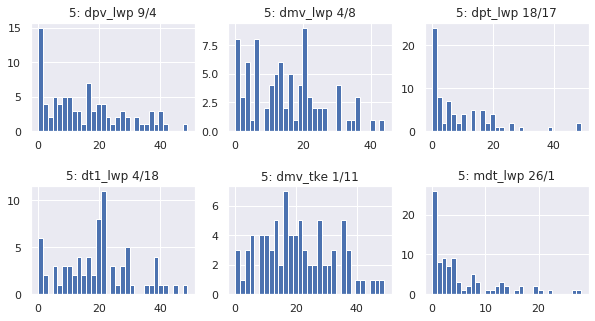

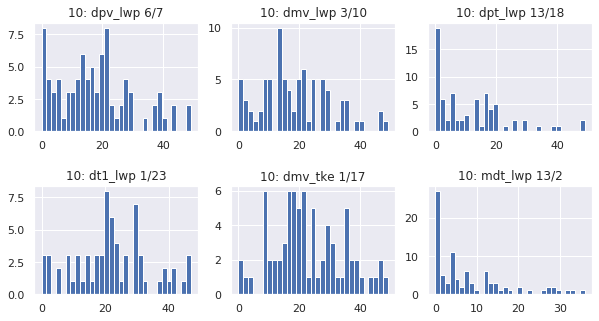

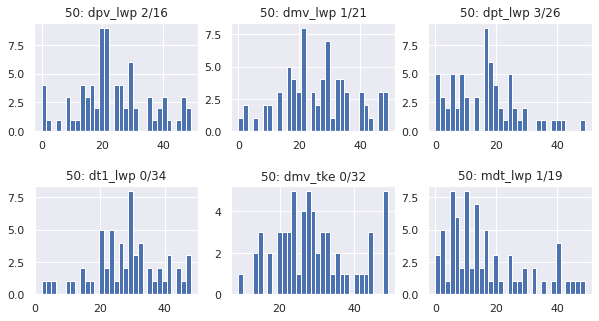

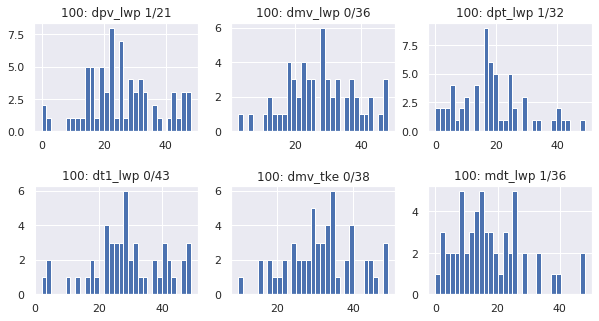

In [218]:
ctpcts=[5,10,50,100]
for pct in ctpcts:
    name='ct_pct'+str(pct)
    i=1
    plt.figure(figsize=(10,5))
    for test in tests:
        plt.subplot(2,3,i)
        i=i+1
        data=tdata[name][test][:]
        try:
             plt.hist(data,bins=31)
        except:
            pass
        plt.title(str(pct)+': '+test+' '+str(np.sum(np.array(data)==0))+'/'+str(np.sum(np.isnan(data))))
    plt.subplots_adjust(hspace=.5)

In [ ]:
for 

In [124]:
plotter=[]
for folder in daylist2:
    fp2c_sfc1=nc.Dataset(clubb_dir+'sgp_nocpl_m/sgp_'+folder+'/k_2/c_1/output/arm_sfc.nc','r')
    fp2c_sfc2=nc.Dataset(clubb_dir+'sgp_nocpl_m/sgp_'+folder+'/k_2/c_2/output/arm_sfc.nc','r')
    
    lwp_2c1=fp2c_sfc1['lwp'][:,0,0,0]
    lwp_2c2=fp2c_sfc2['lwp'][:,0,0,0]
    plotter.append(np.mean(np.abs(lwp_2c2-lwp_2c1))/(np.mean(lwp_2c2)+np.mean(lwp_2c1)))

(array([ 9., 14.,  9., 16.,  4.,  1.,  1.,  4.,  3.,  2.,  3.,  0.,  4.,
         5.,  2.,  1.,  1.,  2.,  1.,  3.,  1.,  0.,  0.,  2.,  0.,  2.,
         0.,  0.,  0.,  2.]),
 array([0.0241597 , 0.04844516, 0.07273062, 0.09701608, 0.12130154,
        0.14558701, 0.16987247, 0.19415793, 0.21844339, 0.24272885,
        0.26701432, 0.29129978, 0.31558524, 0.3398707 , 0.36415616,
        0.38844163, 0.41272709, 0.43701255, 0.46129801, 0.48558347,
        0.50986894, 0.5341544 , 0.55843986, 0.58272532, 0.60701078,
        0.63129625, 0.65558171, 0.67986717, 0.70415263, 0.72843809,
        0.75272356]),
 <a list of 30 Patch objects>)

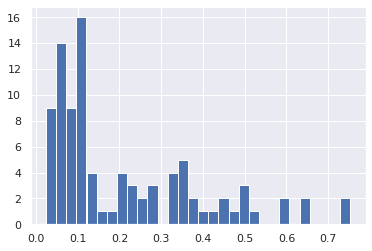

In [126]:
plt.hist(plotter,bins=)

In [138]:
a=np.array([1,2,3,4,5,6,7,8,9,10,11,12,10,9,8,7,6,5,4])

In [145]:
len(np.where(a>=15)[0])

0

In [185]:
from scipy import stats

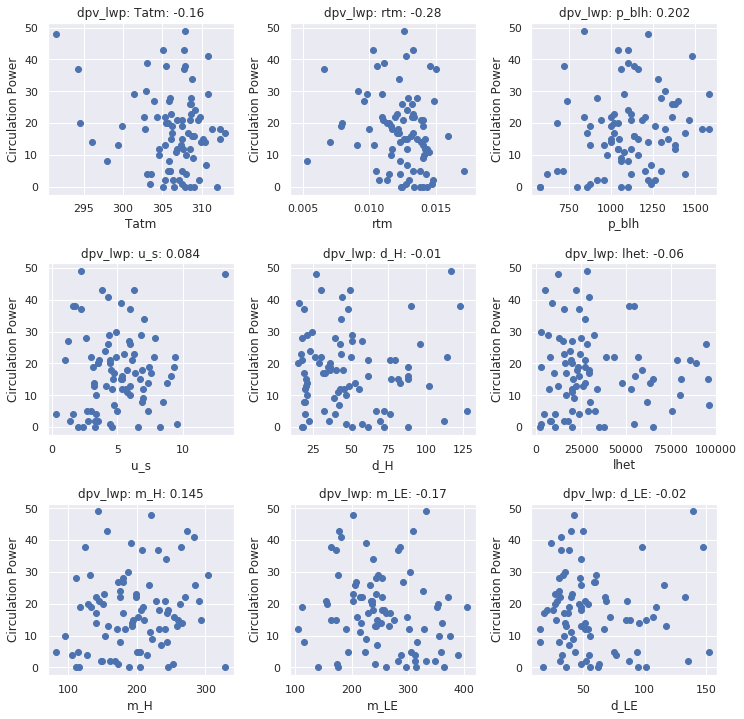

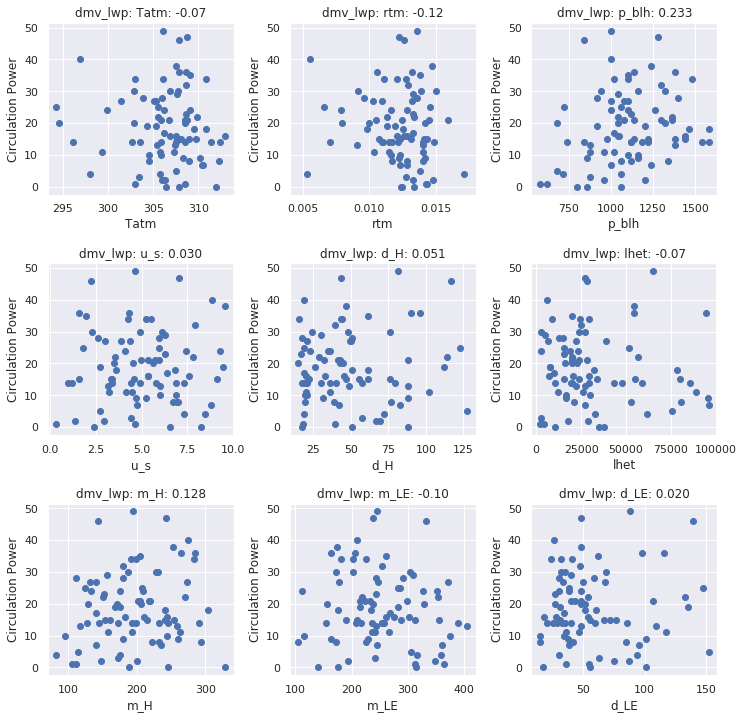

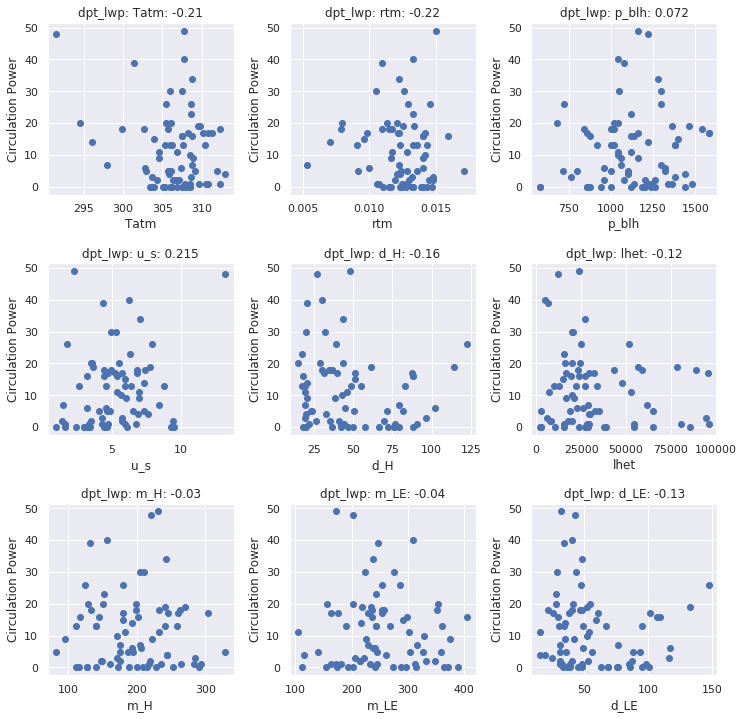

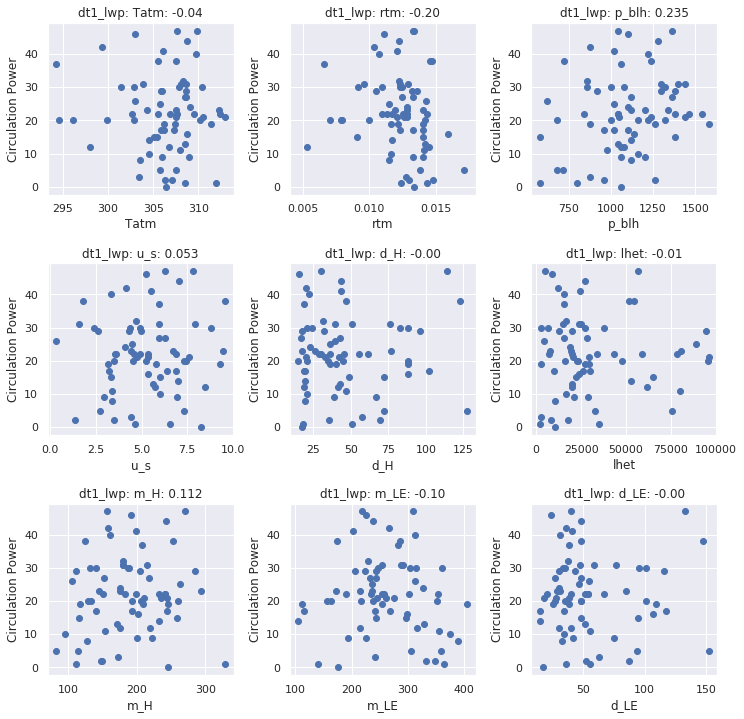

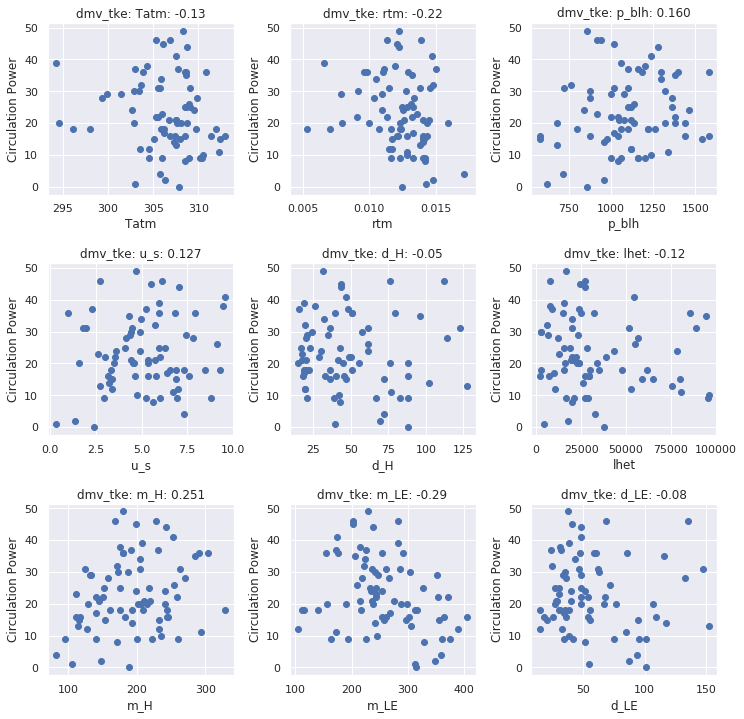

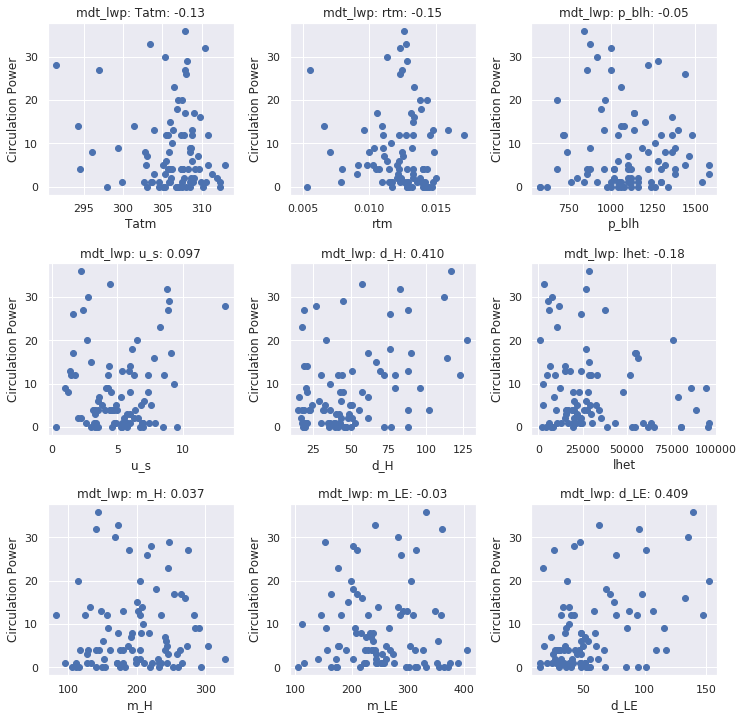

In [283]:
for test in tests:
    plt.figure(figsize=(12,12))
    i=1
    for var in tdata['vars'].keys():
        plt.subplot(3,3,i)
        plt.scatter(tdata['vars'][var][:],tdata['ct_pct10'][test][:])
        i=i+1
        cv=[]
        ct=[]
        cvv=tdata['vars'][var][:]
        ctt=tdata['ct_pct10'][test][:]
        for j in range(len(tdata['vars'][var][:])):
            if np.isnan(cvv[j]) or np.isnan(ctt[j]):
                continue
            #elif (ctt[j]==0):
                #continue
            else:
                cv.append(cvv[j])
                ct.append(ctt[j])
        pr=stats.pearsonr(cv, ct)[0]
        plt.title(test+': '+var+': '+str(pr)[0:5])
        plt.xlabel(var)
        plt.ylabel('Circulation Power')
        if var =='rtm':
            plt.xlim(0.004,.018)
    plt.subplots_adjust(hspace=.4,wspace=.3)

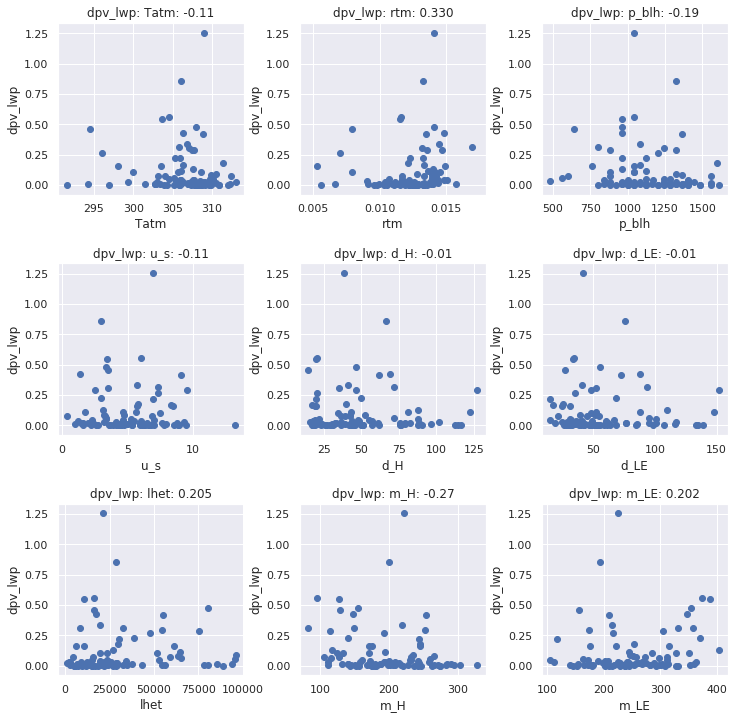

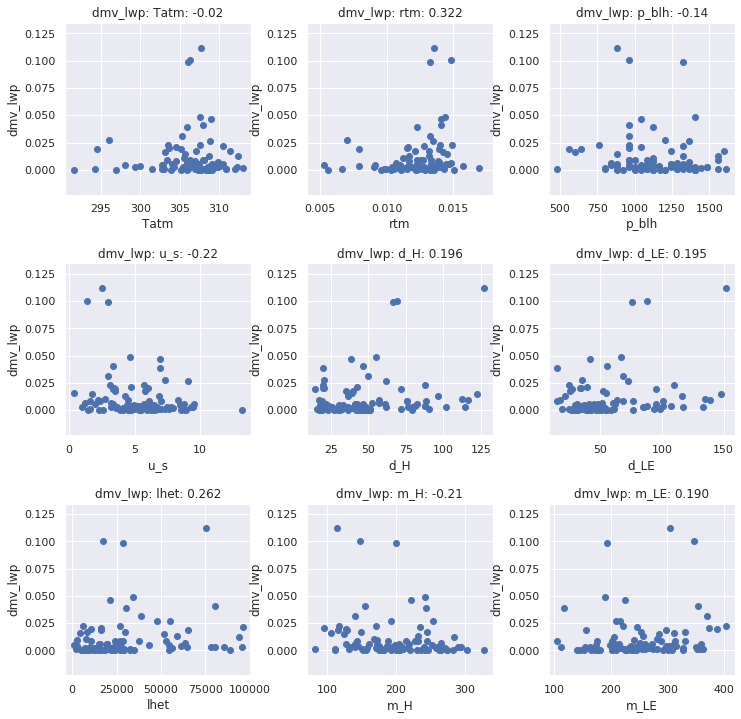

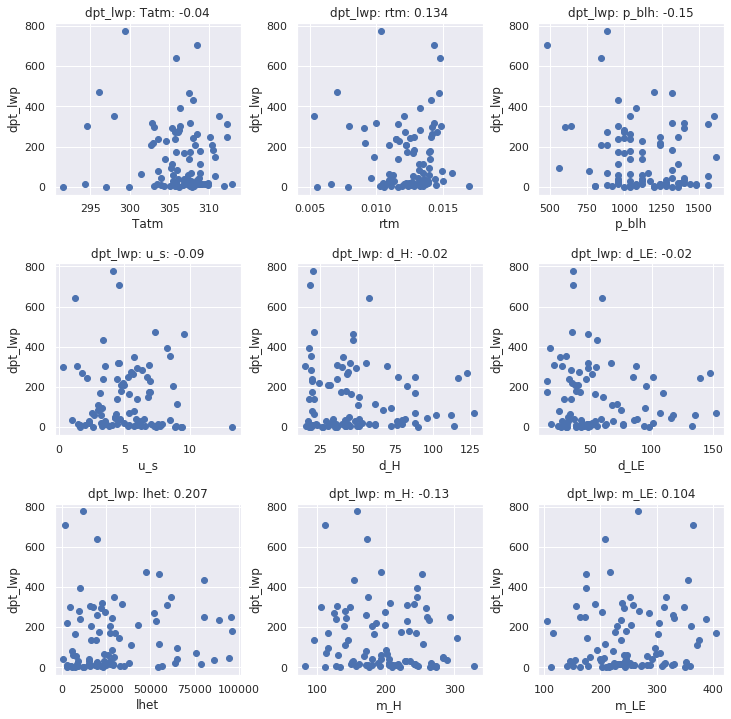

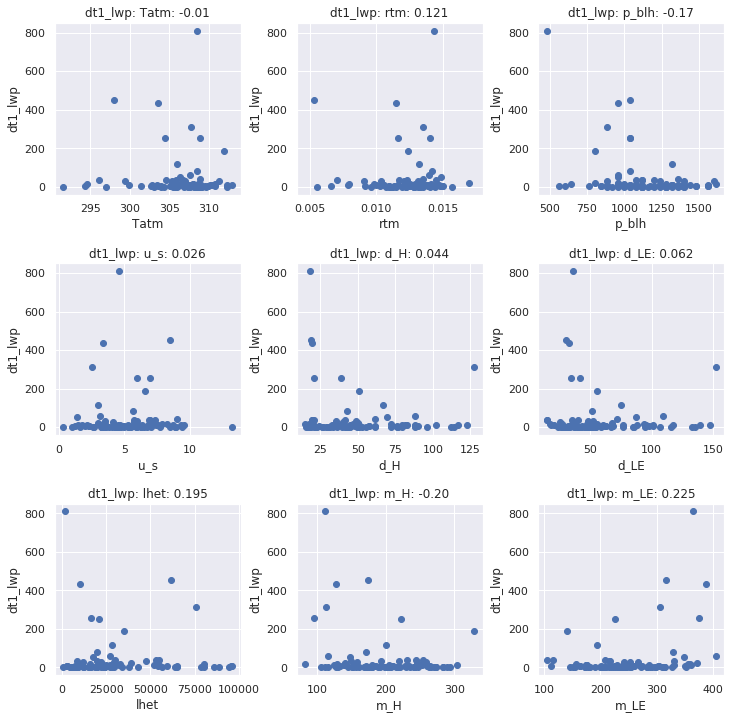

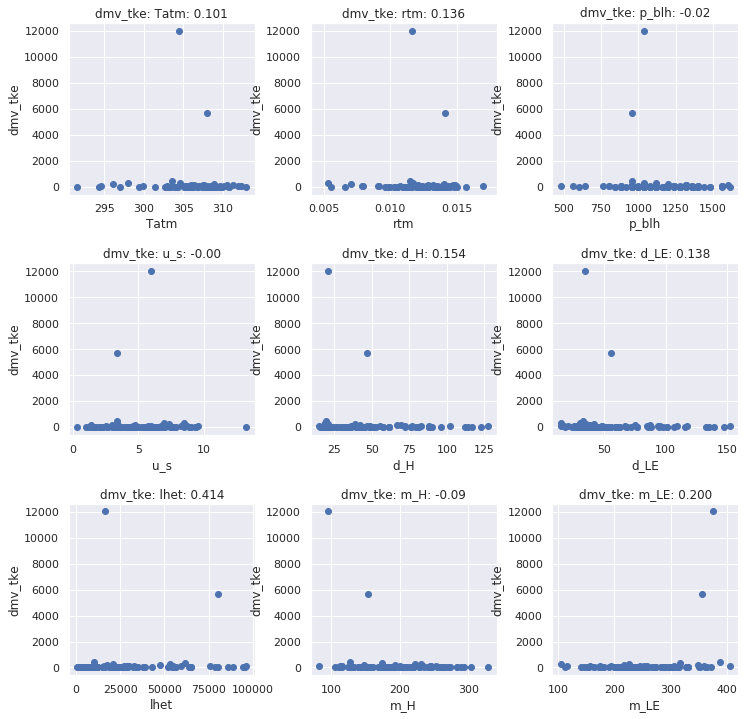

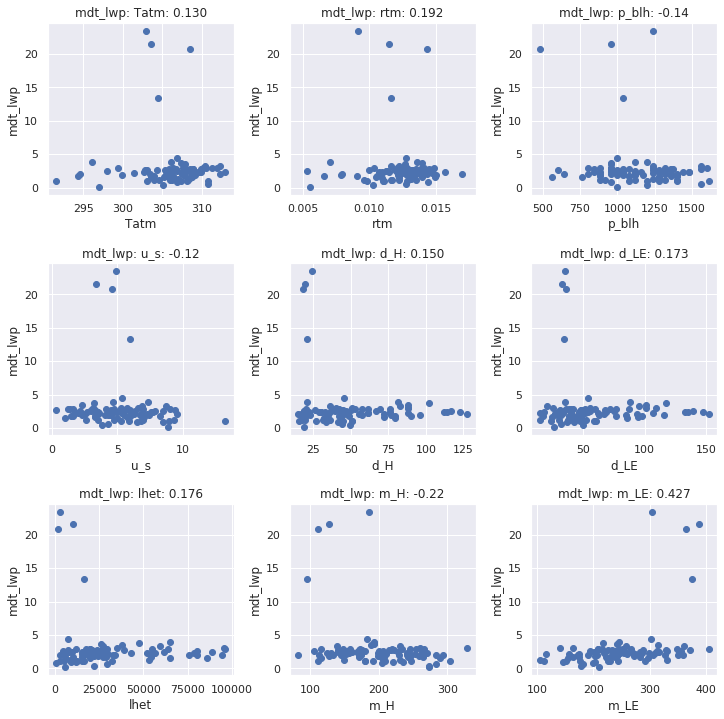

In [303]:
for test in tests:
    plt.figure(figsize=(12,12))
    i=1
    for var in tdata['vars'].keys():
        plt.subplot(3,3,i)
        v=tdata['vars'][var][:]
        t=np.abs(np.array(tdata['tests'][test])[:,20])
        plt.scatter(v,t)
        i=i+1
        pr=stats.spearmanr(v,t)[0]
        plt.title(test+': '+var+': '+str(pr)[0:5])
        plt.xlabel(var)
        plt.ylabel(test)
        if var =='rtm':
            plt.xlim(0.004,.018)
    plt.subplots_adjust(hspace=.4,wspace=.3)

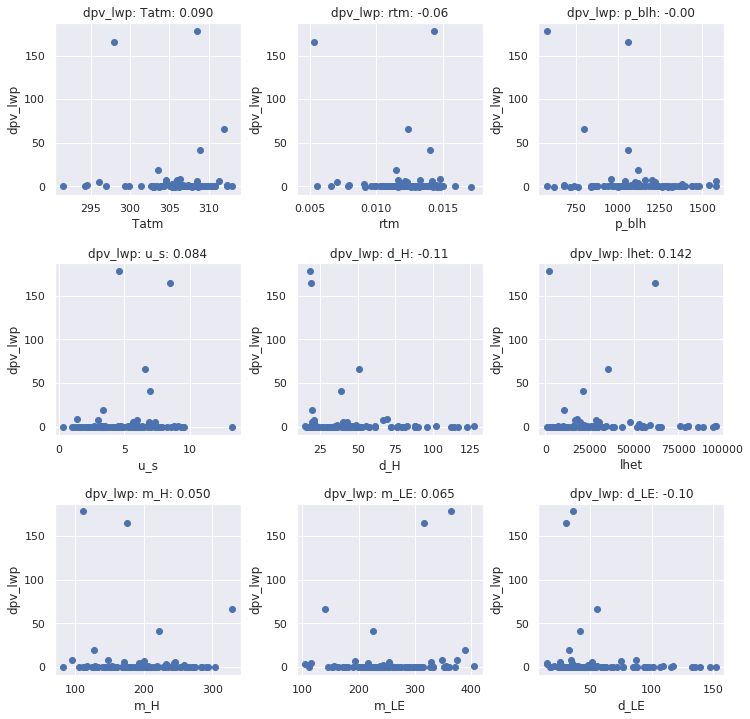

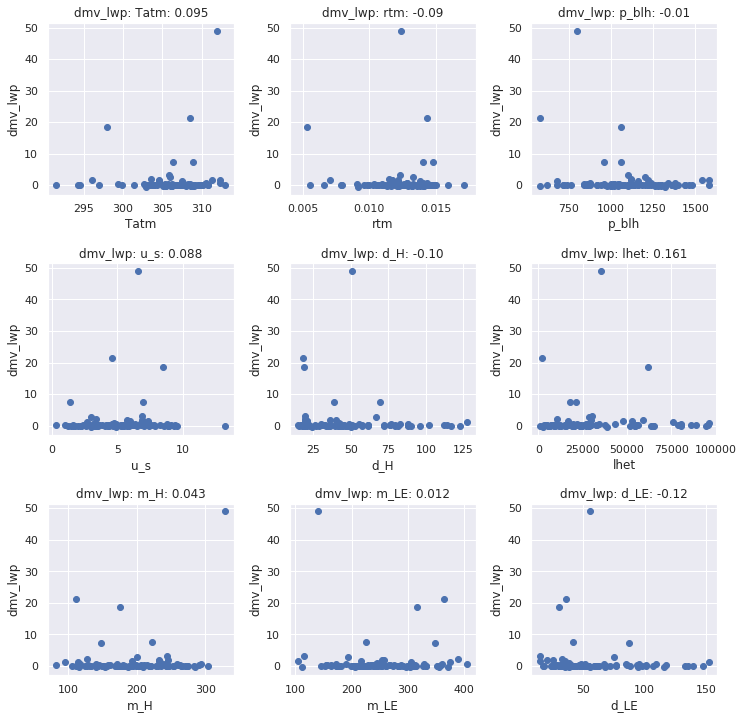

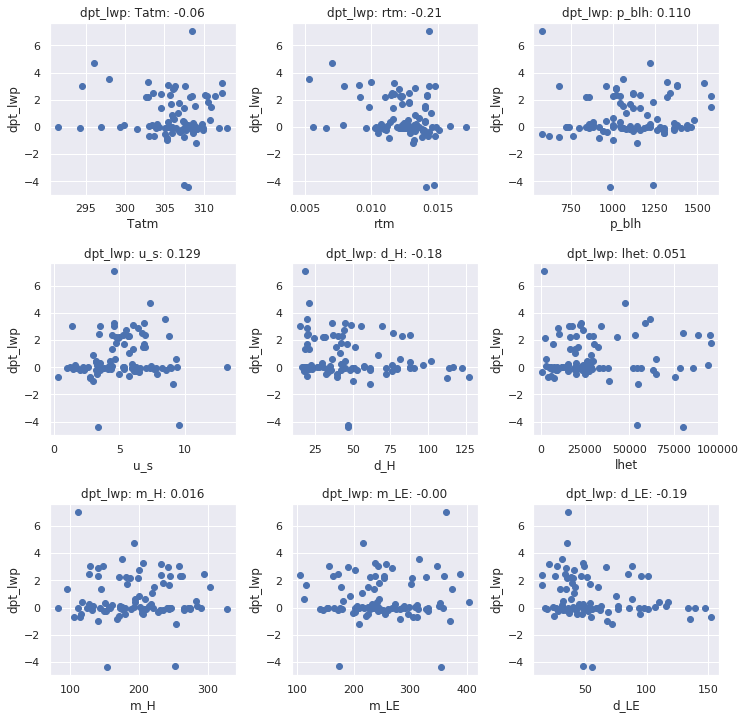

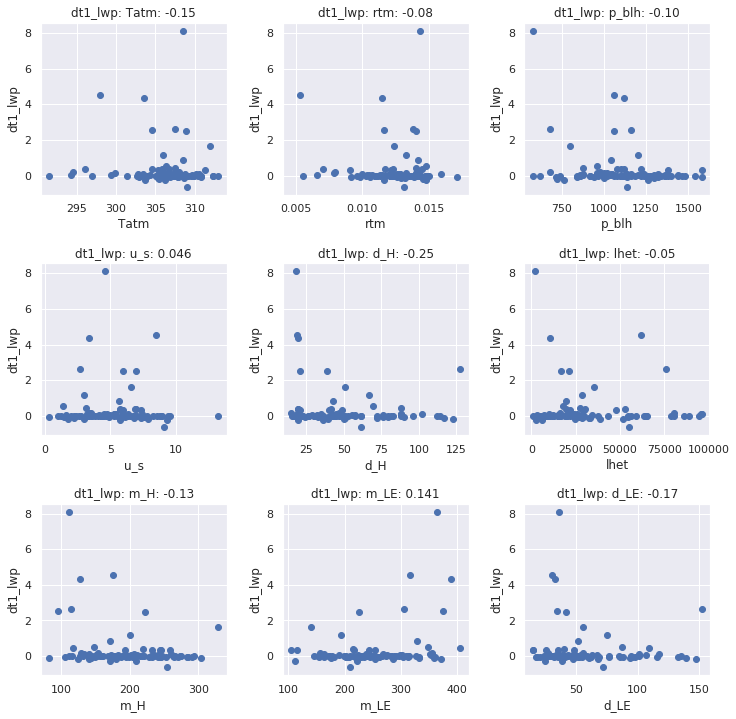

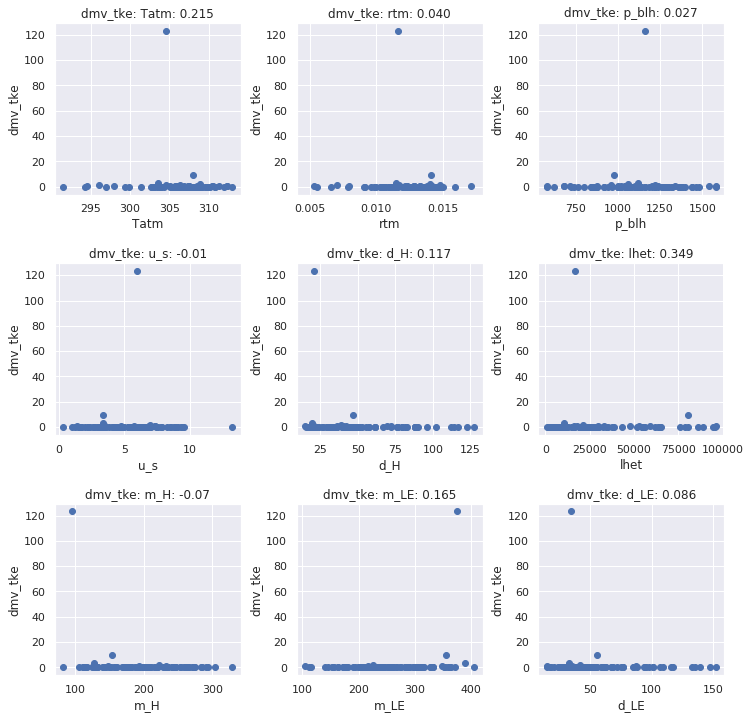

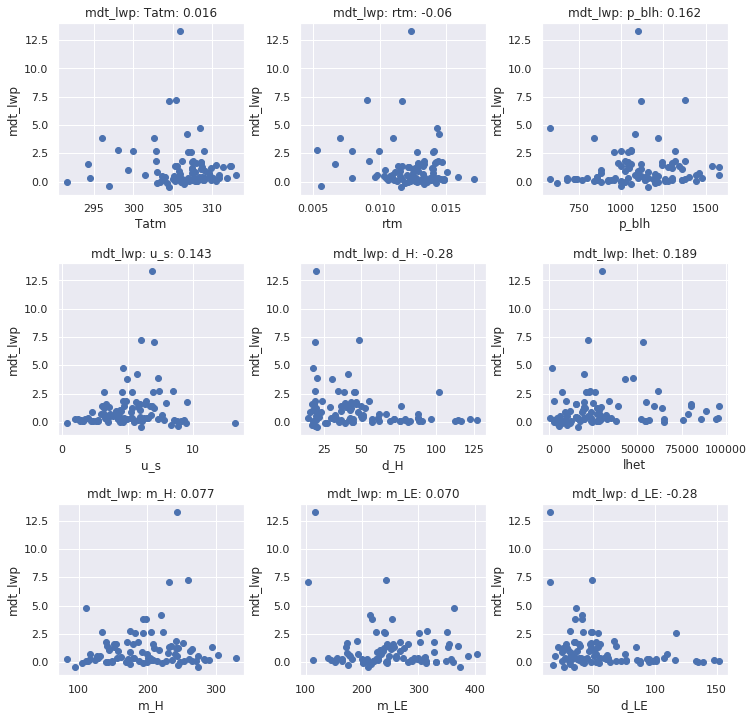

In [285]:
for test in tests:
    plt.figure(figsize=(12,12))
    i=1
    for var in tdata['vars'].keys():
        plt.subplot(3,3,i)
        v=tdata['vars'][var][:]
        t=np.array(tdata['ntests'][test])[:,20]
        plt.scatter(v,t)
        i=i+1
        pr=stats.spearmanr(v,t)[0]
        plt.title(test+': '+var+': '+str(pr)[0:5])
        plt.xlabel(var)
        plt.ylabel(test)
        if var =='rtm':
            plt.xlim(0.004,.018)
    plt.subplots_adjust(hspace=.4,wspace=.3)

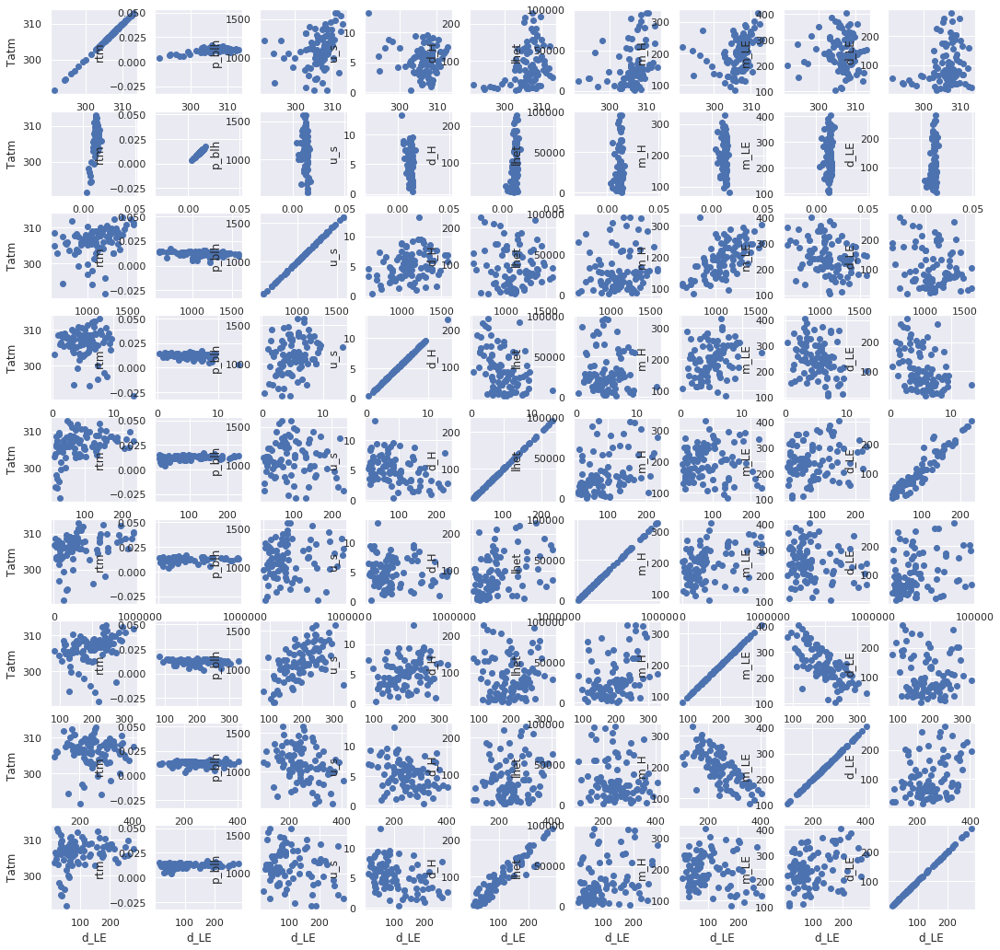

In [271]:
plt.figure(figsize=(18,18))
i=1
for var1 in tdata['vars'].keys():
    for var2 in tdata['vars'].keys():
        plt.subplot(9,9,i)
        plt.scatter(tdata['vars'][var1][:],tdata['vars'][var2][:])
        plt.xlabel(var1)
        plt.ylabel(var2)
        i=i+1

In [287]:
dbfile = open('../tdata_base1c.p', 'rb')     
tdata = pickle.load(dbfile)

<Figure size 1296x216 with 0 Axes>

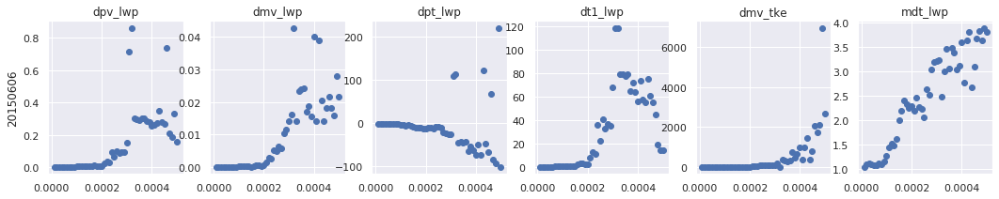

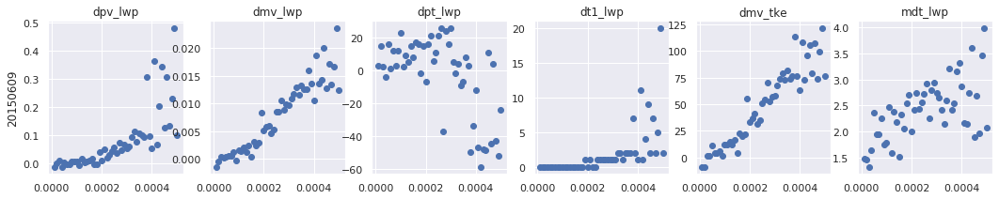

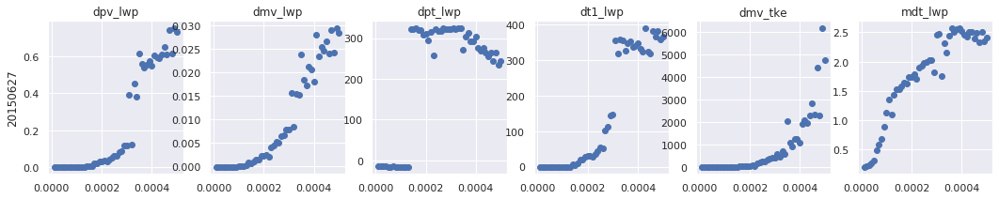

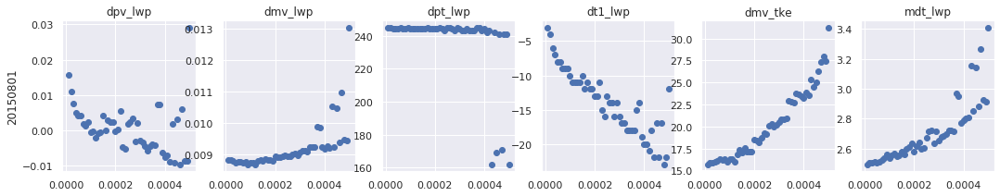

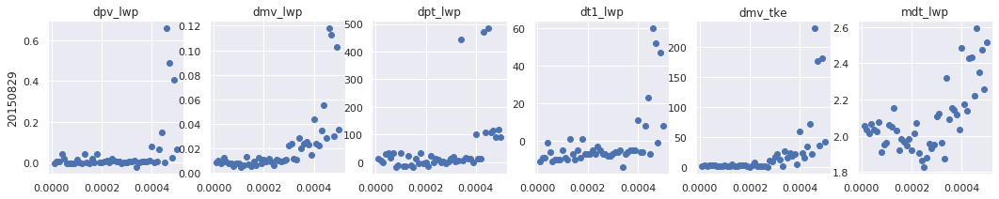

...

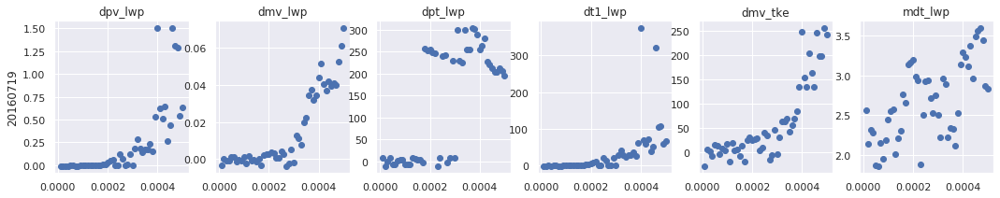

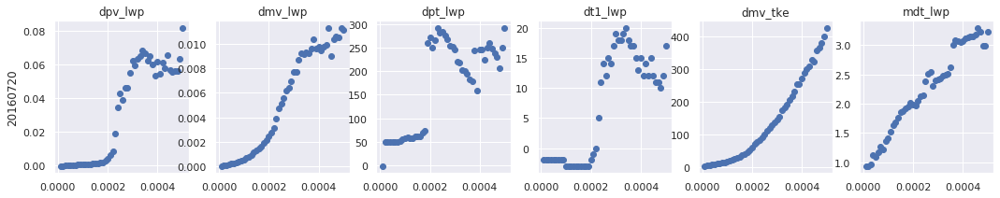

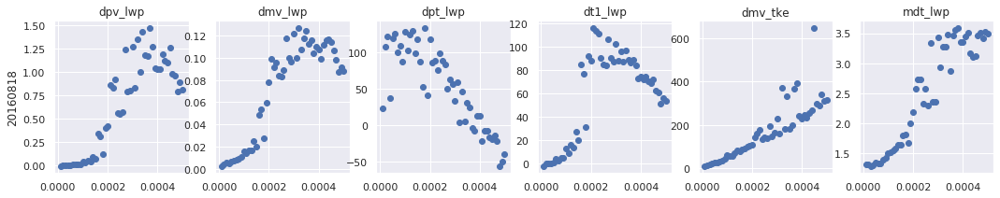

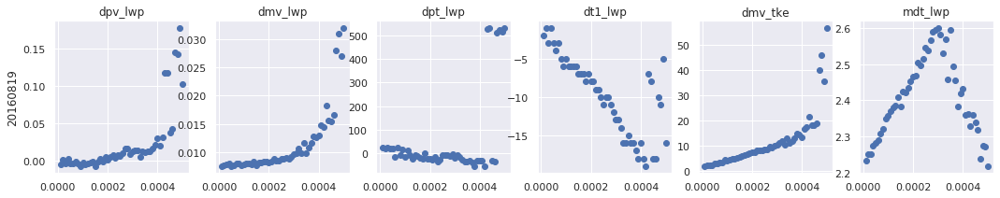

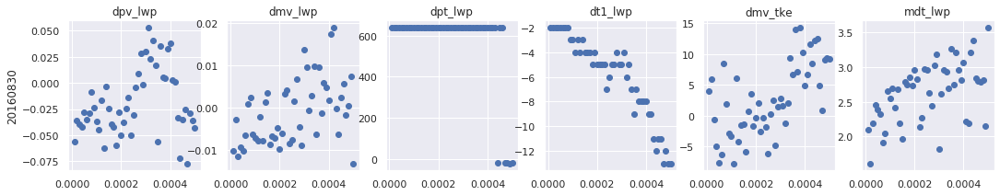

In [288]:
########################
#### PLOT TEST DATA ####
########################
plt.figure(figsize=(18,3))
i=1
for j in range(18):
    plt.figure(figsize=(18,3))
    i=1 
    for test in tests:
        plt.subplot(1,6,i)
        if i == 1:
            plt.ylabel(daylist2[j])
        i=i+1
        plt.plot(ct_n,tdata['tests'][test][j],'o')
        plt.title(test)
    j=j+1

<Figure size 1296x216 with 0 Axes>

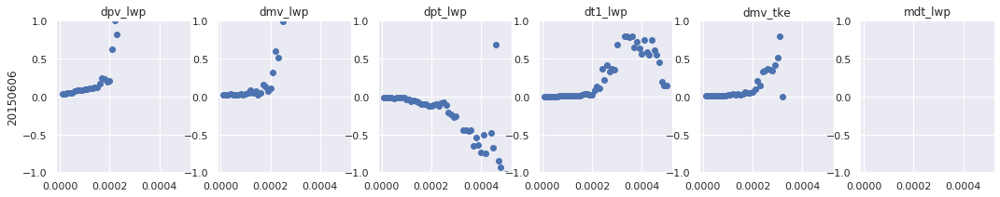

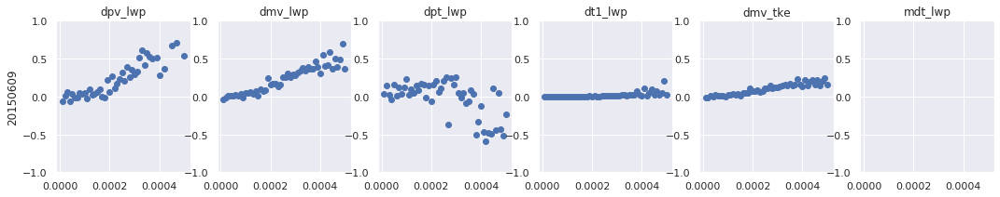

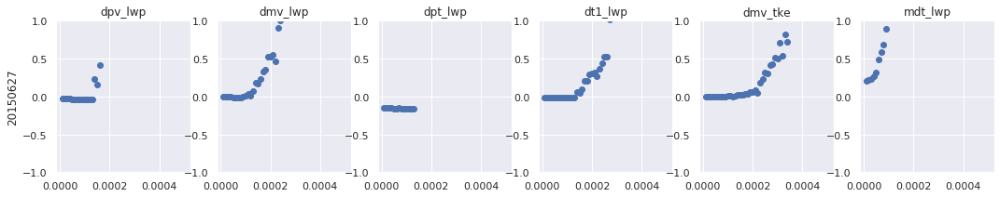

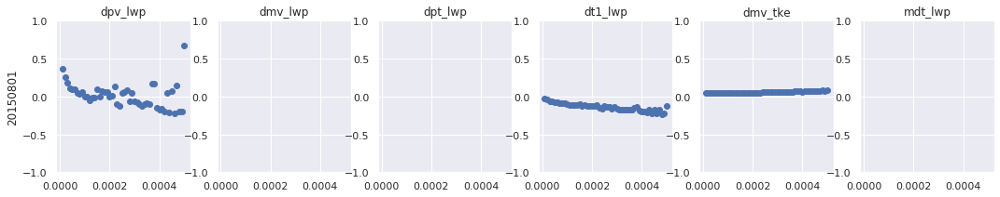

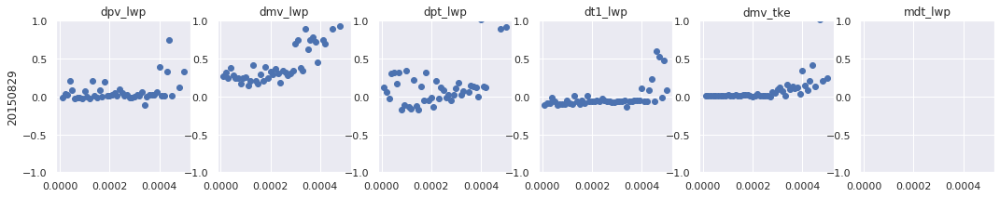

...

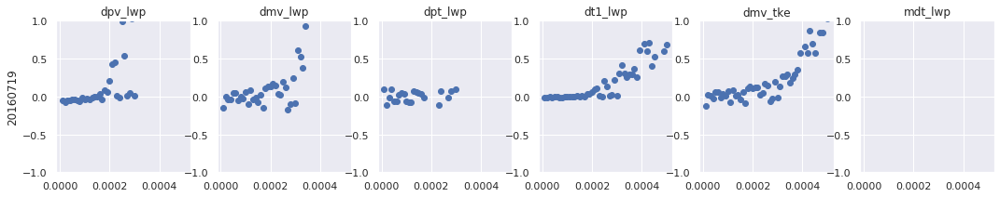

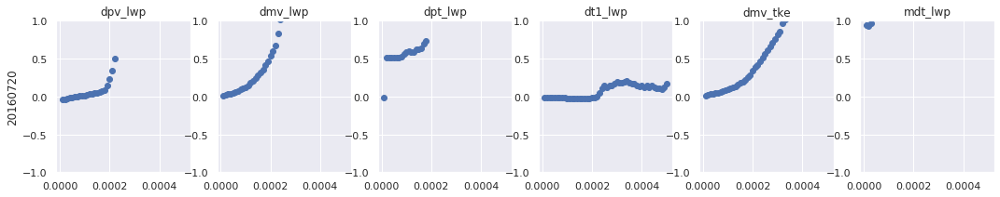

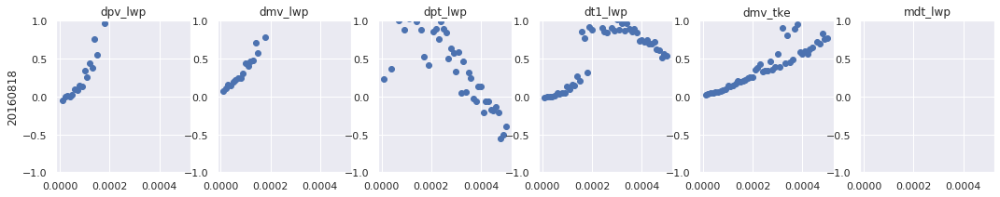

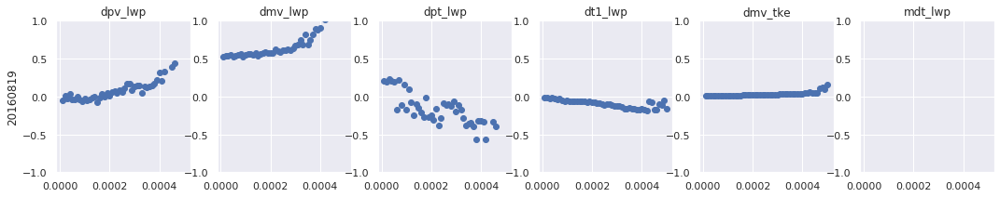

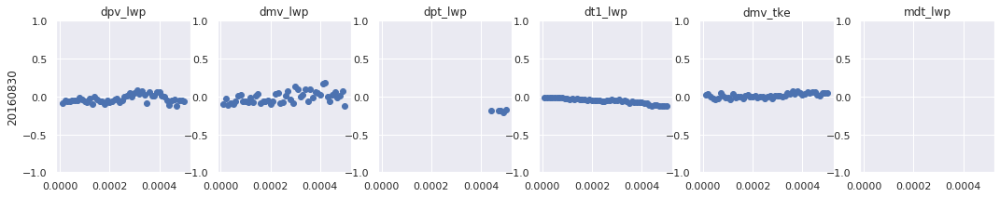

In [289]:
########################
#### PLOT TEST DATA ####
########################
plt.figure(figsize=(18,3))
i=1
for j in range(18):
    plt.figure(figsize=(18,3))
    i=1 
    for test in tests:
        plt.subplot(1,6,i)
        if i == 1:
            plt.ylabel(daylist2[j])
        i=i+1
        plt.plot(ct_n,tdata['ntests'][test][j],'o')
        plt.ylim(-1,1)
        plt.title(test)
    j=j+1

In [290]:
def get_lhet(run_dir):
    fp_=open(run_dir+'/tw_run_param.txt','r')
    for line in fp_:
        if 'l_het' in line:
            return float(line.split(' ')[4])
    return 5

In [291]:
def compute_LE(LE,clst_):
    LEclst=np.zeros((LE.shape[0],2))
    for t in range(LE.shape[0]):
        LEclst[t,0]=np.mean(LE[t][clst_==0])
        LEclst[t,1]=np.mean(LE[t][clst_==1])
    return LEclst

In [292]:
######################
#### LOAD IN VARS ####
######################
#tdata['vars']['Tsfc']=[]
tdata['vars']['Tatm']=[] # bottom 25
tdata['vars']['rtm']=[] # bottom 25
tdata['vars']['p_blh']=[] # 95pct boundary layer height
tdata['vars']['u_s'] =[] #windspeed
tdata['vars']['d_H'] =[]
#tdata['vars']['u_dir']=[] #wind direction relative to het
tdata['vars']['d_LE']=[]
tdata['vars']['lhet']=[]
#tdata['vars']['circ_h']=[]
#tdata['vars']['circ_v']=[]
tdata['vars']['m_H']=[]
tdata['vars']['m_LE']=[]
for folder in daylist2:
    
    fp2c_zt=nc.Dataset(clubb_dir+'sgp_1c/sgp_'+folder+'/k_1/c_1/output/arm_zt.nc','r')
    fp2c_zm=nc.Dataset(clubb_dir+'sgp_1c/sgp_'+folder+'/k_1/c_1/output/arm_zm.nc','r')
    fp2c_sfc=nc.Dataset(clubb_dir+'sgp_1c/sgp_'+folder+'/k_1/c_1/output/arm_sfc.nc','r')
    #fp2c_sfc1=nc.Dataset(clubb_dir+'sgp_nocpl_m/sgp_'+folder+'/k_2/c_1/output/arm_sfc.nc','r')
    #fp2c_sfc2=nc.Dataset(clubb_dir+'sgp_nocpl_m/sgp_'+folder+'/k_2/c_2/output/arm_sfc.nc','r')
    fp2c_clst=nc.Dataset(clubb_dir+'sgp_nocpl_m/sgp_'+folder+'/k_2/clusters.nc','r')
    
    #tdata['vars']['Tsfc'].append(np.mean(fp2c_sfc['T_sfc'][:,0,0,0]))
    tdata['vars']['Tatm'].append(np.mean(fp2c_zt['thlm'][:,0:25,0,0]))
    tdata['vars']['rtm'].append(np.mean(fp2c_zt['rtm'][:,0:25,0,0]))
    tdata['vars']['p_blh'].append(np.percentile(fp2c_sfc['blh'][:,0,0,0],95))
    tdata['vars']['u_s'].append(np.mean((fp2c_zt['um'][:,0:25,0,0]**2+\
                                        fp2c_zt['vm'][:,0:25,0,0]**2)**(1/2)))
    #tdata['vars']['d_H'].append(np.abs(np.mean(fp2c_clst['H_clst'][4:10,1])\
    #                                   -np.mean(fp2c_clst['H_clst'][4:10,0])))
    #leclst=compute_LE(fp2c_clst['LE'][:],fp2c_clst['cluster'][0,:,:])
    #tdata['vars']['d_LE'].append(np.abs(np.mean(leclst[4:10,1])\
    #                                   -np.mean(leclst[4:10,0])))
    tdata['vars']['d_H'].append(np.mean(np.std(fp2c_clst['H'][4:10,:,:],axis=(1,2))))
    tdata['vars']['d_LE'].append(np.mean(np.std(fp2c_clst['LE'][4:10,:,:],axis=(1,2))))
    tdata['vars']['lhet'].append(get_lhet(clubb_dir+'sgp_cpl_m/sgp_'+folder))
    #tdata['vars']['circ_h']
    #tdata['vars']['circ_v']
    tdata['vars']['m_H'].append(np.mean(fp2c_clst['H'][4:10,:,:]))
    tdata['vars']['m_LE'].append(np.mean(fp2c_clst['LE'][4:10,:,:]))

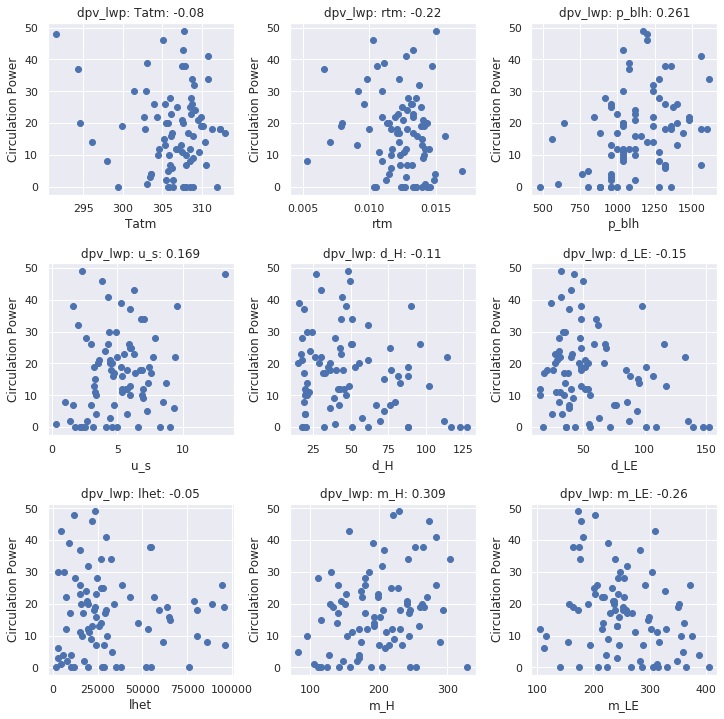

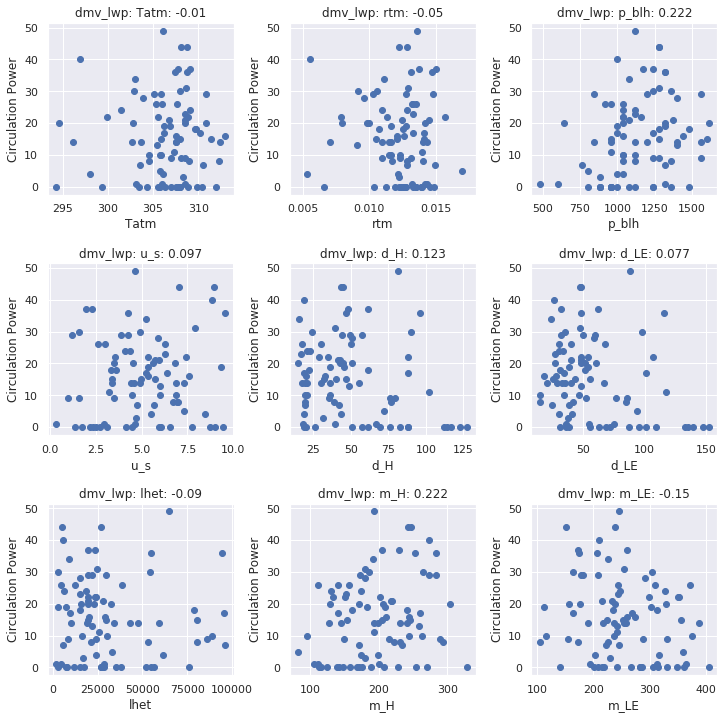

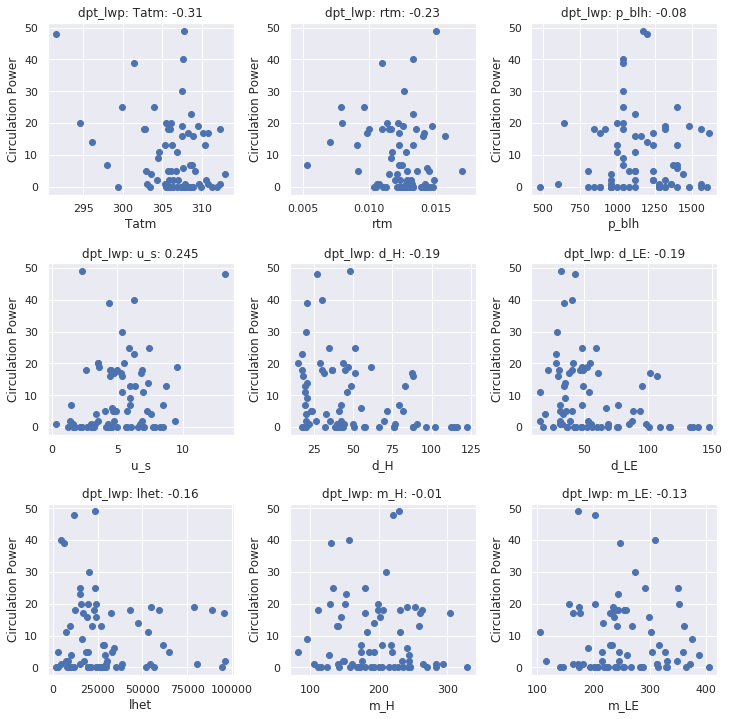

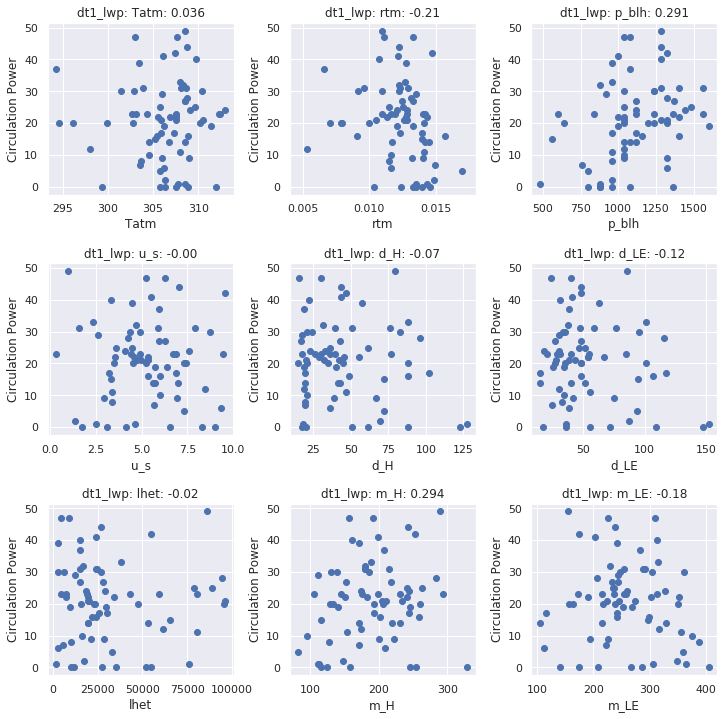

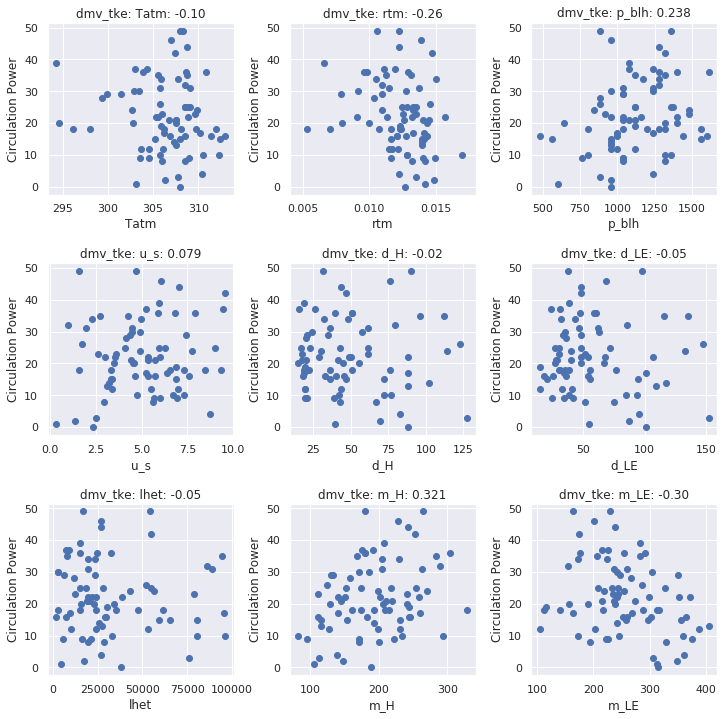

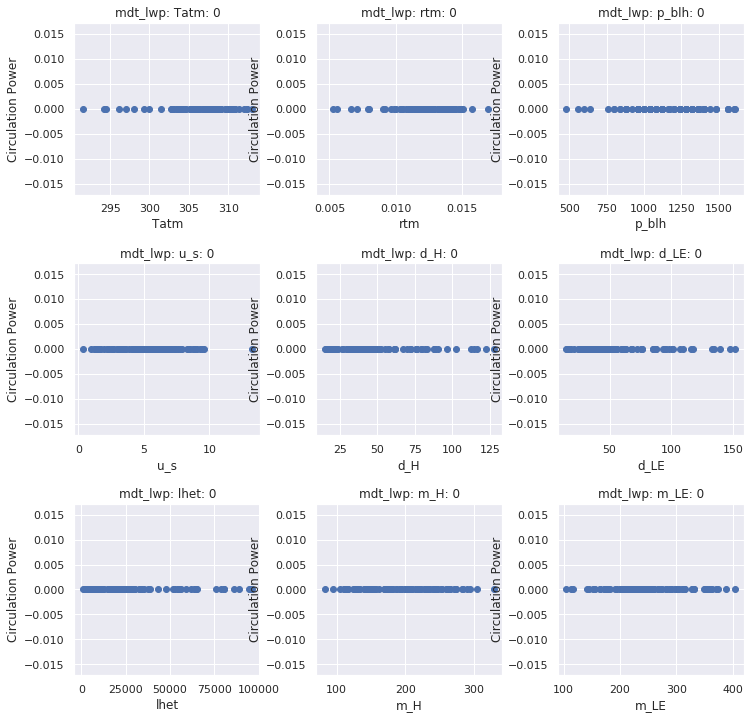

In [302]:
for test in tests:
    plt.figure(figsize=(12,12))
    i=1
    for var in tdata['vars'].keys():
        plt.subplot(3,3,i)
        plt.scatter(tdata['vars'][var][:],tdata['ct_pct10'][test][:])
        i=i+1
        cv=[]
        ct=[]
        cvv=tdata['vars'][var][:]
        ctt=tdata['ct_pct10'][test][:]
        for j in range(len(tdata['vars'][var][:])):
            if np.isnan(cvv[j]) or np.isnan(ctt[j]):
                continue
            elif (ctt[j]==0):
                continue
            else:
                cv.append(cvv[j])
                ct.append(ctt[j])
        #print(len(cv))
        #print(len(ct))
        try:
            pr=stats.pearsonr(cv, ct)[0]
        except:
            pr=0
        plt.title(test+': '+var+': '+str(pr)[0:5])
        plt.xlabel(var)
        plt.ylabel('Circulation Power')
        if var =='rtm':
            plt.xlim(0.004,.018)
    plt.subplots_adjust(hspace=.4,wspace=.3)

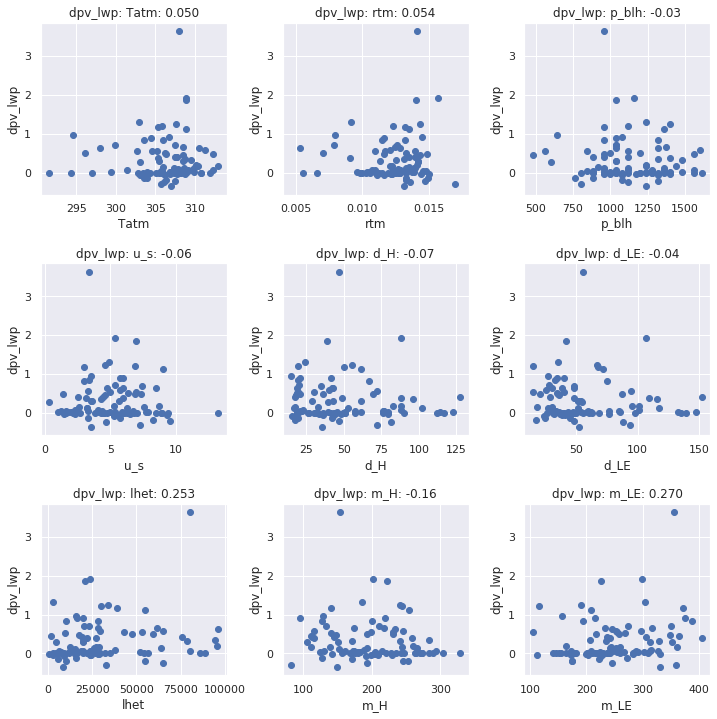

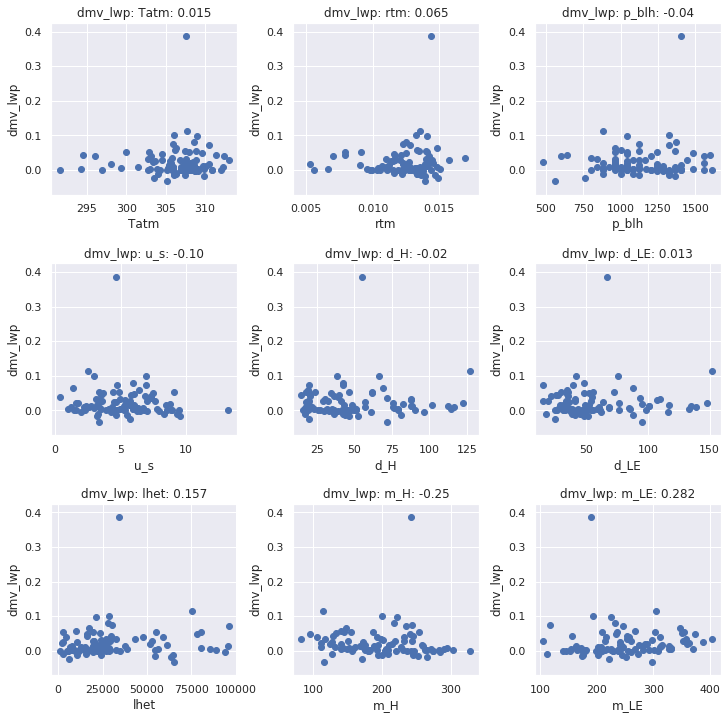

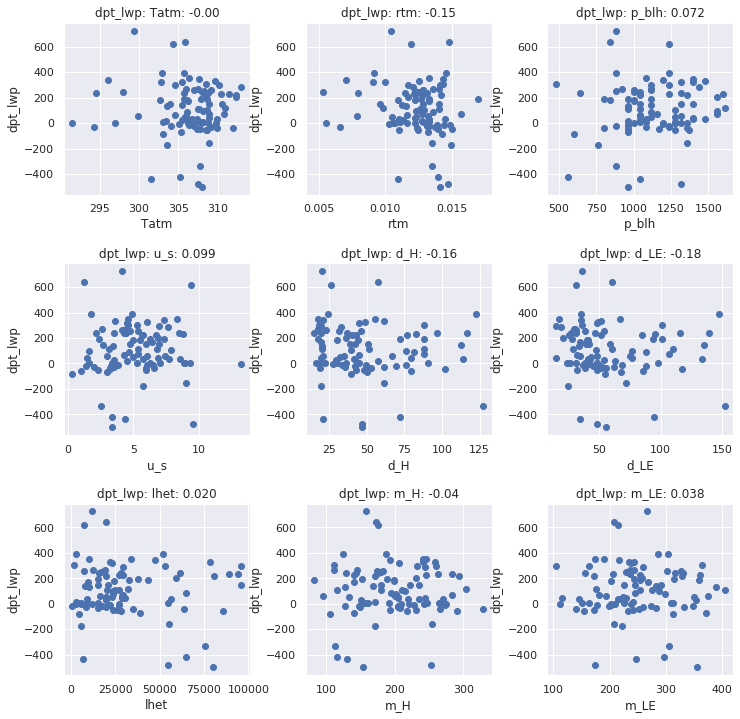

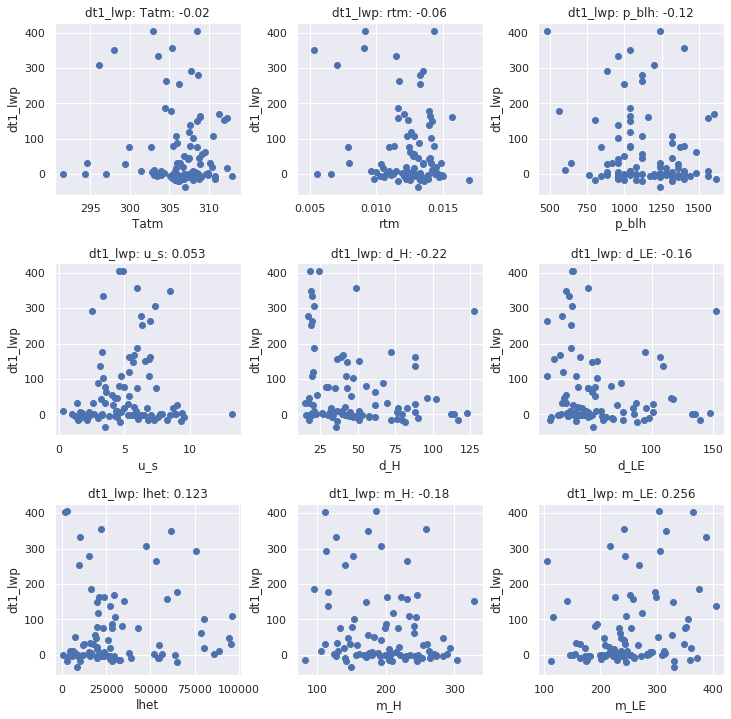

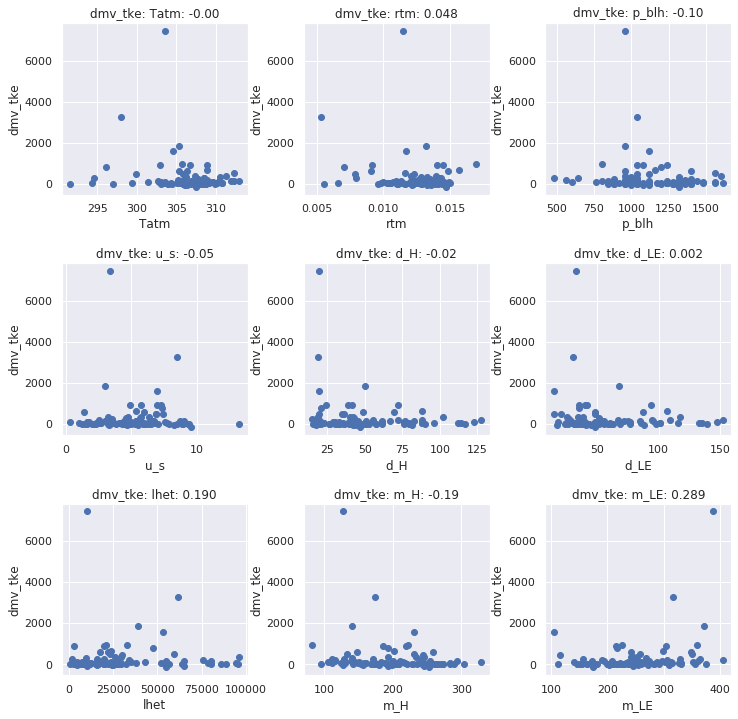

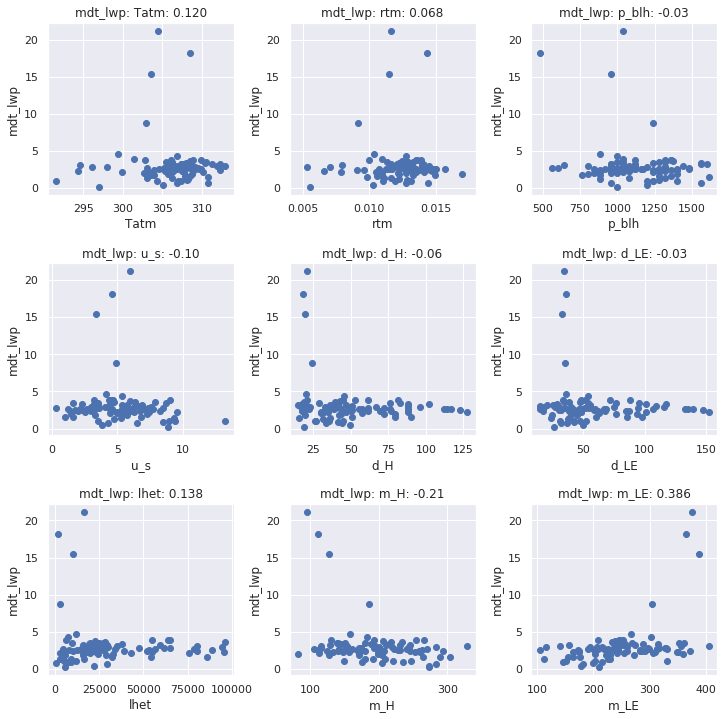

In [296]:
for test in tests:
    plt.figure(figsize=(12,12))
    i=1
    for var in tdata['vars'].keys():
        plt.subplot(3,3,i)
        v=tdata['vars'][var][:]
        t=np.array(tdata['tests'][test])[:,30]
        plt.scatter(v,t)
        i=i+1
        pr=stats.spearmanr(v,t)[0]
        plt.title(test+': '+var+': '+str(pr)[0:5])
        plt.xlabel(var)
        plt.ylabel(test)
        if var =='rtm':
            plt.xlim(0.004,.018)
    plt.subplots_adjust(hspace=.4,wspace=.3)

In [182]:
metrics.r2_score(cv,ct)

-10.243493400136513

In [179]:
np.max(tdata['vars']['rtm'][:])

0.01712738722388012

In [235]:
np.array(tdata['tests']['dpv_lwp']).shape

(92, 50)